In [18]:

import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16 
from tensorflow.keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import tensorflow as tf
from umap import UMAP
import tensorflow as tf
import hdbscan



In [19]:
import tensorflow as tf
print(tf.__version__)
from keras.applications.vgg16 import preprocess_input


2.8.0


Train data:  (50000, 32, 32, 3)
Train filenames:  (50000,)
Train labels:  (50000,)
Test data:  (10000, 32, 32, 3)
Test filenames:  (10000,)
Test labels:  (10000,)
Label names:  (10,)


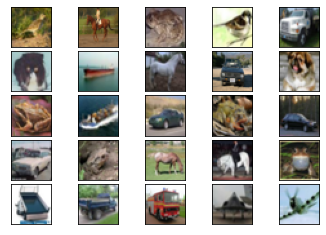

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import pickle

"""
The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 
training images and 10000 test images.
The dataset is divided into five training batches and one test batch, each with 10000 images. The test batch contains 
exactly 1000 randomly-selected images from each class. The training batches contain the remaining images in random 
order, but some training batches may contain more images from one class than another. Between them, the training 
batches contain exactly 5000 images from each class.
"""


def unpickle(file):
    """load the cifar-10 data"""

    with open(file, 'rb') as fo:
        data = pickle.load(fo, encoding='bytes')
    return data


def load_cifar_10_data(data_dir, negatives=False):
    """
    Return train_data, train_filenames, train_labels, test_data, test_filenames, test_labels
    """

    # get the meta_data_dict
    # num_cases_per_batch: 1000
    # label_names: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
    # num_vis: :3072

    meta_data_dict = unpickle(data_dir + "/cifar-10-batches-py/batches.meta")
    cifar_label_names = meta_data_dict[b'label_names']
    cifar_label_names = np.array(cifar_label_names)

    # training data
    cifar_train_data = None
    cifar_train_filenames = []
    cifar_train_labels = []

    # cifar_train_data_dict
    # 'batch_label': 'training batch 5 of 5'
    # 'data': ndarray
    # 'filenames': list
    # 'labels': list

    for i in range(1, 6):
        cifar_train_data_dict = unpickle(data_dir + "/data_batch_{}".format(i))
        if i == 1:
            cifar_train_data = cifar_train_data_dict[b'data']
        else:
            cifar_train_data = np.vstack((cifar_train_data, cifar_train_data_dict[b'data']))
        cifar_train_filenames += cifar_train_data_dict[b'filenames']
        cifar_train_labels += cifar_train_data_dict[b'labels']

    cifar_train_data = cifar_train_data.reshape((len(cifar_train_data), 3, 32, 32))
    if negatives:
        cifar_train_data = cifar_train_data.transpose(0, 2, 3, 1).astype(np.float32)
    else:
        cifar_train_data = np.rollaxis(cifar_train_data, 1, 4)
    cifar_train_filenames = np.array(cifar_train_filenames)
    cifar_train_labels = np.array(cifar_train_labels)

    # test data
    # cifar_test_data_dict
    # 'batch_label': 'testing batch 1 of 1'
    # 'data': ndarray
    # 'filenames': list
    # 'labels': list

    cifar_test_data_dict = unpickle(data_dir + "/test_batch")
    cifar_test_data = cifar_test_data_dict[b'data']
    cifar_test_filenames = cifar_test_data_dict[b'filenames']
    cifar_test_labels = cifar_test_data_dict[b'labels']

    cifar_test_data = cifar_test_data.reshape((len(cifar_test_data), 3, 32, 32))
    if negatives:
        cifar_test_data = cifar_test_data.transpose(0, 2, 3, 1).astype(np.float32)
    else:
        cifar_test_data = np.rollaxis(cifar_test_data, 1, 4)
    cifar_test_filenames = np.array(cifar_test_filenames)
    cifar_test_labels = np.array(cifar_test_labels)

    return cifar_train_data, cifar_train_filenames, cifar_train_labels, \
        cifar_test_data, cifar_test_filenames, cifar_test_labels, cifar_label_names


if __name__ == "__main__":
    """show it works"""
    data_dir ="B_net/datasets/data/cifar10"
    cifar_10_dir = 'cifar-10-batches-py'

    train_data, train_filenames, train_labels, test_data, test_filenames, test_labels, label_names = \
        load_cifar_10_data(data_dir)

    print("Train data: ", train_data.shape)
    print("Train filenames: ", train_filenames.shape)
    print("Train labels: ", train_labels.shape)
    print("Test data: ", test_data.shape)
    print("Test filenames: ", test_filenames.shape)
    print("Test labels: ", test_labels.shape)
    print("Label names: ", label_names.shape)

    # Don't forget that the label_names and filesnames are in binary and need conversion if used.

    # display some random training images in a 25x25 grid
    num_plot = 5
    f, ax = plt.subplots(num_plot, num_plot)
    for m in range(num_plot):
        for n in range(num_plot):
            idx = np.random.randint(0, train_data.shape[0])
            ax[m, n].imshow(train_data[idx])
            ax[m, n].get_xaxis().set_visible(False)
            ax[m, n].get_yaxis().set_visible(False)
    f.subplots_adjust(hspace=0.1)
    f.subplots_adjust(wspace=0)
    plt.show()


In [21]:
print(train_labels)

[6 9 9 ... 9 1 1]


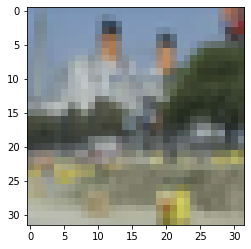

In [22]:
plt.imshow(cifar_x_test[4000:4001].reshape(32,32,3))

In [5]:
x_train, train_filenames, y_train, x_test, test_filenames, y_test, label_names = \
        load_cifar_10_data(data_dir)

In [6]:
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

(50000, 32, 32, 3) (50000,) (10000, 32, 32, 3) (10000,)


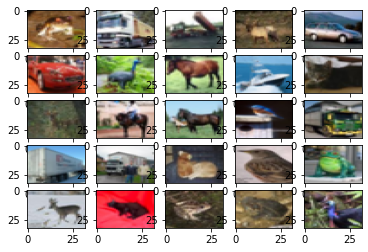

In [7]:
fig, ax = plt.subplots(5, 5)
k = 0
 
for i in range(5):
    for j in range(5):
        ax[i][j].imshow(x_train[k], aspect='auto')
        k += 1
 
plt.show()

In [8]:
def find_classes(x):
    x_train_subclass=[]
    y_train_subclass=[]
    index = np.where(y_train == x)
    #print(index[0])
    for indices in index[0]:
       x_train_subclass.append(x_train[indices])
       y_train_subclass.append(y_train[indices])
    #print(len(x_train_subclass))
    #plt.imshow(x_train_subclass[10].reshape(32,32,3))
    x_train_subclass = np.array(x_train_subclass)
    x_train_subclass= x_train_subclass.reshape(5000,3072)
    print(len(x_train_subclass), len(y_train_subclass))
    
    return x_train_subclass,y_train_subclass,x

In [9]:
find_classes(0)

5000 5000


(array([[202, 204, 199, ..., 240, 238, 243],
        [126, 118, 110, ..., 121, 113, 102],
        [251, 249, 250, ..., 105, 121,  26],
        ...,
        [192, 184, 169, ..., 144, 120,  94],
        [155, 155, 155, ..., 135, 118,  72],
        [156, 159, 164, ..., 152, 160, 162]], dtype=uint8),
 [0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  

In [10]:
reducer2 = UMAP(n_neighbors=15, n_components=2, n_epochs=1000, 
                min_dist=0.1, local_connectivity=2, random_state=42,
              )
def Hdb_cluster(x_train_subclass,y_train_subclass,x):
   featured_subclass = reducer2.fit_transform(x_train_subclass)
   print(featured_subclass.shape)
   clusterer = hdbscan.HDBSCAN(min_cluster_size=100)
   cluster_labels = clusterer.fit_predict(featured_subclass) 
   print(clusterer.labels_)
   clusterer.labels_.max()
   return cluster_labels
   
   
 

In [279]:
import numpy as np
import pandas as pd 
def train_exits():
    df = pd.read_csv('Y_train.txt', header= None, usecols=[0], sep='\t')
    train_exits= df.values.tolist()
    train_exits= np.array(train_exits)
    train_exits=train_exits.reshape(50000,1)
    return train_exits

In [113]:
train_exits= train_exits()

In [14]:
cifar_x_train=x_train
cifar_x_test =x_test
cifar_y_train = y_train
cifar_y_test = y_test
cifar_x_train, cifar_x_test = x_train / 255.0, x_test / 255.0
 
# flatten the label values
cifar_y_train, cifar_y_test = y_train.flatten(), y_test.flatten()

In [15]:
x_t,t_t, x = find_classes(0)
labels = Hdb_cluster(x_t,t_t, x)

5000 5000
(5000, 2)
[-1 -1 -1 ...  5 -1 -1]


In [60]:
print(len(labels))

5000


In [16]:
groups = {}
for file, cluster in zip(x_t,labels):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [71]:
#print(len(set(labels)))
cluster_list=[]
for idx in set(labels):
    #print(idx)
    cluster_indexes = "cluster_indexes"
    cluster_indexes= cluster_indexes+str(idx)
    #cluster_indexes= np.where(labels == idx)
    print(cluster_indexes)
    cluster_list.append(cluster_indexes)
    


cluster_indexes0
cluster_indexes1
cluster_indexes2
cluster_indexes-1


In [72]:
print(len(cluster_list))

4


In [85]:
real_index = np.where(y_train == 0)

In [102]:
''''total_hard=[]
total_easy=[]

for idx,clusters in zip(set(labels),cluster_list):
    print(clusters)
    print(idx)
    clusters= np.where(labels == idx)
    print(len(clusters[0]))
    #print(clusters[0])
    print(len(clusters[0]))
    clusters_realindexes=[]
    for x in clusters[0]:
        clusters_realindexes.append(real_index[0][x])   
    print(len(clusters_realindexes))
    cluster_easyindex=[]
    cluster_hardindex=[]
    cluster_easyimages=[]
    cluster_hardimages=[]
    for idx in clusters_realindexes:
        if(train_exits[idx]==0):
           cluster_easyindex.append(idx)
           cluster_easyimages.append(x_train[idx])
        else:
           cluster_hardindex.append(idx)
           cluster_hardimages.append(x_train[idx])
    print(len(cluster_easyimages))
    if((len(cluster_easyimages)>=(len(cluster_hardimages)))):
        total_hard.append(cluster_hardimages)
        total_easy.append(cluster_easyimages[:len(cluster_hardimages)])
    else:
        total_hard.append(cluster_hardimages[:len(cluster_easyimages)])
        total_easy.append(cluster_easyimages)
        
''''''

cluster_indexes0
0
132
132
132
66
cluster_indexes1
1
355
355
355
248
cluster_indexes2
2
394
394
394
187
cluster_indexes-1
-1
4119
4119
4119
2246


In [114]:
len(total_hard[2])


187

In [115]:
len(total_easy[2])

187

In [23]:
def calculate_entropy(model,cifar_x_test):
    cifar_x_test=np.array(cifar_x_test)
    xdata = cifar_x_test.reshape(-1, 32, 32, 3)
    #ydata = cifar_y_test
    softmax_data = model.predict(xdata)
    entropy_value = np.array([entropy(s) for s in softmax_data]) 
    ret =0
    #print(entropy_value)
    #print(len(entropy_value))
    minimum = entropy_value[0]
    #print(entropy_value[609])
    for idx in range(1,len(entropy_value)):
        if(minimum>entropy_value[idx]):
            minimum = entropy_value[idx]
            #print(minimum)
            ret=idx
            
    return  ret

In [12]:
print(calculate_entropy(model,cifar_x_test))

NameError: name 'model' is not defined

In [281]:
score = model.evaluate( cifar_x_test, cifar_y_test, batch_size=32, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 4s 12ms/step - loss: 0.9482 - accuracy: 0.8300
Test loss: 0.9481577277183533
Test accuracy: 0.8299999833106995


In [720]:
overall_acc= []
for idx in range(0,len(cifar_x_train)):
    score = model.evaluate( cifar_x_train[idx:idx+1], cifar_y_train[idx:idx+1], batch_size=32, verbose=1)
    overall_acc.append(score[1])
    

1/1 [==============================] - 0s 27ms/step - loss: 2.2650e-06 - accuracy: 1.0000


In [162]:
if(overall_acc[1000]==1):
    print("true")
else:
    print("False")

true


In [1]:
!pip3 install chainer

In [22]:
import chainer
import chainer.functions as F
from scipy.stats import entropy

In [29]:
softmax = F.softmax(cifar_x_train,axis=0)
print(softmax.data)
cifar_x_train=np.array(cifar_x_train)
xdata = cifar_x_train.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
#softmax_data = model.predict(xdata)
entropy_value = np.array([entropy(s) for s in softmax.data])
train_entroexits=[]
easy_entropy_data=[]
easy_entropy_label=[]

hard_entropy_data=[]
hard_entropy_level=[]

[[[[1.44839432e-05 1.43646820e-05 1.44900736e-05]
   [1.36483317e-05 1.35384664e-05 1.35535441e-05]
   [1.39820617e-05 1.36060639e-05 1.34125042e-05]
   ...
   [2.13511820e-05 1.89056496e-05 1.73129876e-05]
   [2.09010468e-05 1.84299832e-05 1.69344857e-05]
   [2.05817207e-05 1.83647295e-05 1.70012237e-05]]

  [[1.22751194e-05 1.22289129e-05 1.23054584e-05]
   [1.15732110e-05 1.13536224e-05 1.14267782e-05]
   [1.23824069e-05 1.16874457e-05 1.14028127e-05]
   ...
   [1.87045113e-05 1.59962548e-05 1.41586371e-05]
   [1.84557738e-05 1.57140616e-05 1.38998269e-05]
   [1.86759799e-05 1.59648787e-05 1.42841760e-05]]

  [[1.27443567e-05 1.24627234e-05 1.24171910e-05]
   [1.23635108e-05 1.17227338e-05 1.15011399e-05]
   [1.40378675e-05 1.26588206e-05 1.18536667e-05]
   ...
   [1.84199467e-05 1.58353418e-05 1.39851422e-05]
   [1.86001618e-05 1.58529317e-05 1.39914345e-05]
   [1.78024623e-05 1.51732401e-05 1.35451611e-05]]

  ...

  [[2.66570470e-05 2.30703599e-05 1.80012094e-05]
   [2.61643230e-

In [24]:
print(entropy_value[1000])

[[3.43661584 3.44476393 3.44203742]
 [3.44204646 3.44895575 3.44445967]
 [3.430615   3.4380106  3.43567661]
 [3.42667696 3.43316793 3.43765916]
 [3.43070422 3.43737864 3.44169941]
 [3.42965886 3.4381576  3.43997398]
 [3.42856726 3.4382886  3.44077945]
 [3.42546154 3.43596657 3.44133524]
 [3.43317431 3.44156634 3.44187764]
 [3.44176273 3.44717572 3.44623671]
 [3.44751042 3.45150529 3.45246828]
 [3.4406622  3.44554022 3.44564868]
 [3.43556781 3.44088688 3.44123915]
 [3.43843505 3.44377397 3.44552175]
 [3.43878518 3.44450482 3.44663615]
 [3.43718492 3.44153856 3.44226724]
 [3.43866184 3.44209834 3.44146824]
 [3.44116379 3.44396275 3.44244238]
 [3.43788076 3.439917   3.43822309]
 [3.43626876 3.43806938 3.43762925]
 [3.43212978 3.43515526 3.43644798]
 [3.44121408 3.44565516 3.44653071]
 [3.43276194 3.4390495  3.43931945]
 [3.42859676 3.43508335 3.43533966]
 [3.42329249 3.42995161 3.42955924]
 [3.43240554 3.43869985 3.43907768]
 [3.43330504 3.43881954 3.43706801]
 [3.43485194 3.43991501 3.43

In [53]:
import dill

with open("models/cifar10model.bn", "wb") as f:
    dill.dump(model, f)


NameError: name 'model' is not defined

In [24]:
import dill

with open("models/cifar10model.bn", "rb") as f:
    model = dill.load(f)

2023-01-23 16:00:19.382155: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudnn.so.8'; dlerror: libcudnn.so.8: cannot open shared object file: No such file or directory
2023-01-23 16:00:19.382193: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1850] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2023-01-23 16:00:19.382488: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [331]:
import dill

In [25]:
x_train_branchy=np.array(x_train_branchy)
xdata = x_train_branchy.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
softmax_data = model.predict(xdata)
#print(softmax_data)
entropy_value = np.array([entropy(s) for s in softmax_data])
train_entroexits_test=[]
easy_entropy_data_test=[]
easy_entropy_label_test=[]

hard_entropy_data_test=[]
hard_entropy_level_test=[]




def calculate_thresholded_entropy_value(thresholds):
    count =0
    count_hard=0
    test_set=[]
    test_ylabel=[]
    autoencode_set=[]
    autoencode_label=[]
    train_entroexits=[]
    #train_entroexits=[]
    
    for idx in range(0,len(entropy_value)):
        print(entropy_value[idx])
        if(entropy_value[idx]<thresholds):
            count+=1
            train_entroexits.append(0)
            #easy_entropy_data_test.append(cifar_x_test[idx:idx+1])
            #easy_entropy_label_test.append(cifar_y_test[idx:idx+1])
            
        else:
            count_hard+=1
            train_entroexits.append(1)
            #hard_entropy_data_test.append(cifar_x_test[idx:idx+1])
            #hard_entropy_level_test.append(cifar_y_test[idx:idx+1])
            
        
        
    print("Last")        
    print(count)
    print("easy data",count)
    print("Hard Data",count_hard)
    
    return train_entroexits

NameError: name 'x_train_branchy' is not defined

In [130]:
train_entroexits= calculate_thresholded_entropy_value(0.1220909090909091)

###best threshold til now 0.1220909090909091


1.0369259
0.3178183
6.4589614e-05
0.07693803
5.209176e-15
0.00025820168
1.1672934
0.8731367
1.6457419e-09
3.0226736e-06
0.004292468
1.5797483e-05
3.8185317e-06
0.35371366
0.46564227
1.1571362
0.0072637694
1.0208722
0.010501671
0.022421503
0.13701023
0.5429897
7.604718e-05
0.0023090276
1.8377987e-07
2.6549876e-06
1.16259225e-05
1.235702
2.3070919e-07
5.629783e-13
5.0443155e-10
0.78763103
0.58968735
0.91682893
0.005953434
0.40534133
0.88276345
0.8227738
2.639275e-10
0.023867488
0.013157086
0.4309893
1.003302e-13
0.6027007
0.002111851
2.3812077e-09
0.11608791
1.5485996e-12
0.033936474
0.0062524374
1.1711716e-11
0.08308743
0.53780365
0.00078859605
0.069508255
5.571927e-10
0.4779643
3.73436e-10
0.024280649
7.678787e-06
0.0026141948
8.5983986e-05
5.5987093e-06
0.0017601762
0.0002967246
0.038781032
0.00048598016
0.0064997897
0.6360382
0.00075342617
3.4814223e-14
9.0200774e-05
0.037441667
3.824032e-05
0.7988657
9.915411e-10
0.20087269
0.759356
0.5081981
0.002898001
0.008088121
0.0005611671
0.7

In [282]:
len(train_entroexits)

50000

In [283]:
if(train_entroexits[5000]==0):
    print("True")
else:
    print("false")

false


In [396]:
easy_entropy_data_test=np.array(easy_entropy_data_test).reshape(-1,32,32,3)
hard_entropy_data_test=np.array(hard_entropy_data_test).reshape(-1,32,32,3)
easy_entropy_label_test=np.array(easy_entropy_label_test)
easy_entropy_label_test= easy_entropy_label_test.flatten()
hard_entropy_level_test= np.array(hard_entropy_level_test)
hard_entropy_level_test= hard_entropy_level_test.flatten()


score = model.evaluate( easy_entropy_data_test, easy_entropy_label_test, batch_size=32, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

259/259 [==============================] - 2s 7ms/step - loss: 0.7473 - accuracy: 0.9121
Test loss: 0.7473106980323792
Test accuracy: 0.9121384620666504


In [395]:
score = model.evaluate( hard_entropy_data_test, hard_entropy_level_test, batch_size=32, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

55/55 [==============================] - 0s 7ms/step - loss: 1.9036 - accuracy: 0.4393
Test loss: 1.9035983085632324
Test accuracy: 0.43926310539245605


In [448]:
score = model.evaluate( cifar_x_test, cifar_y_test, batch_size=32, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 0.9482 - accuracy: 0.8300
Test loss: 0.9481577277183533
Test accuracy: 0.8299999833106995


In [336]:
check= dae.predict(hard_entropy_data_test)
check=np.array(check)
check = check.reshape(-1,32,32,3)




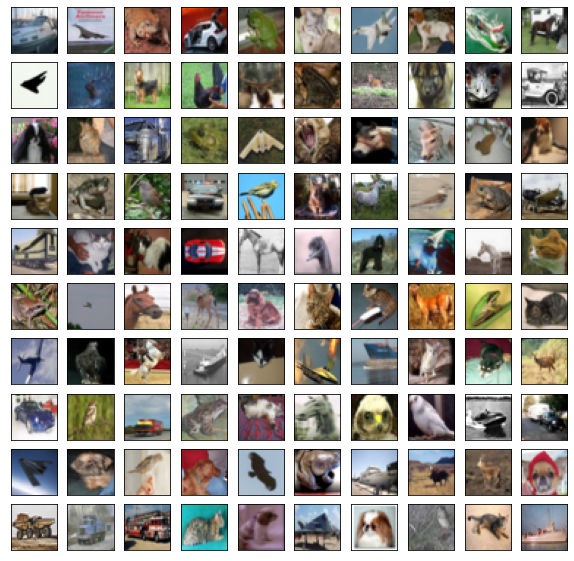

In [341]:
plt.figure(figsize=(20,20))
for i in range(100):
    plt.subplot(10,10,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(hard_entropy_data_test[i].reshape(32,32,3), cmap=plt.cm.binary)
    #plt.xlabel(class_names[train_labels[i]])
plt.show()

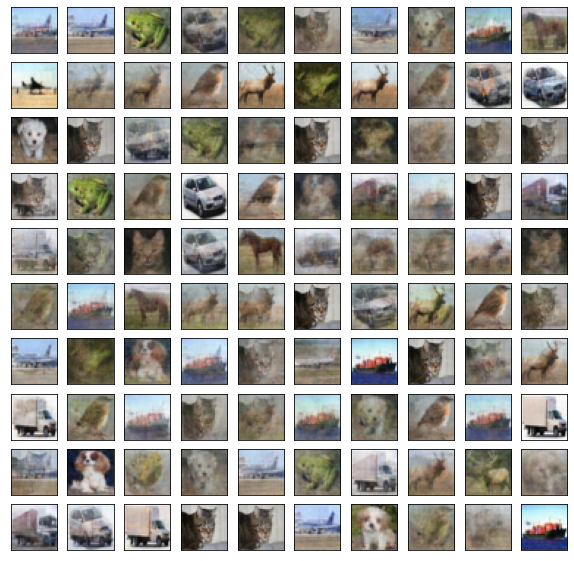

In [342]:
plt.figure(figsize=(10,10))
for i in range(100):
    plt.subplot(10,10,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(check[i].reshape(32,32,3), cmap=plt.cm.binary)
    #plt.xlabel(class_names[train_labels[i]])
plt.show()

In [337]:
score = model.evaluate( check, hard_entropy_level_test, batch_size=32, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

606/606 [==============================] - 5s 7ms/step - loss: 19.0741 - accuracy: 0.4773
Test loss: 19.074058532714844
Test accuracy: 0.4773032069206238


In [ ]:
from sklearn.cluster import SpectralClustering
import numpy as np


In [41]:
import random
'''
def clustering_bucketing(x_t,labels,x):
    groups = {}
    for file, cluster in zip(x_t,labels):
        if cluster not in groups.keys():
          groups[cluster] = []
          groups[cluster].append(file)
        else:
          groups[cluster].append(file)
    cluster_list=[]
    for idx in set(labels):
        #print(idx)
        cluster_indexes = "cluster_indexes"
        cluster_indexes= cluster_indexes+str(idx)
        #cluster_indexes= np.where(labels == idx)
        print(cluster_indexes)
        cluster_list.append(cluster_indexes)
   
    print(len(cluster_list))
    
    real_index = np.where(y_train == x)
    total_hard=[]
    total_easy=[]
    total_real_easy=[]

    for idx,clusters in zip(set(labels),cluster_list):
        print(clusters)
        print(idx)
        clusters= np.where(labels == idx)
        print(len(clusters[0]))
        #print(clusters[0])
        print(len(clusters[0]))
        clusters_realindexes=[]
        for x in clusters[0]:
           clusters_realindexes.append(real_index[0][x])   
        print(len(clusters_realindexes))
        cluster_easyindex=[]
        cluster_hardindex=[]
        cluster_easyimages=[]
        cluster_hardimages=[]
        #cluster_real_images=[]
        ###entropy is
        ###accuarcy ==1
        
        for idx in clusters_realindexes:
            if(train_exits[idx]==0):
            #if(train_entro_exits[idx]==0 and overall_acc[idx]==1):
            #if(train_entro_exits[idx]==0):
               cluster_easyindex.append(idx)
               cluster_easyimages.append(cifar_x_train[idx])
            else:
               cluster_hardindex.append(idx)
               cluster_hardimages.append(cifar_x_train[idx])
        print("Length of easy images in cluster",len(cluster_easyimages))
        print("Length of hard images in cluster",len(cluster_hardimages))
        
        
        if((len(cluster_easyimages)>=(len(cluster_hardimages)))):
             var_easy=[]
             total_hard.append(cluster_hardimages)
             #total_hard.append(cluster_hardimages)
             #total_hard.append(cluster_hardimages)
             #r = random.randint(0, len(cluster_hardimages))
             r = calculate_entropy(model,cluster_easyimages)
             print("entropy index",r)
             var_easy.append(cluster_easyimages[r])
             #print("random number",r)
             #print(var_easy.shape)
             easy_peasy1 = var_easy*len(cluster_hardimages)
             print("Actual length")
             print(len(cluster_hardimages))
             print("Easy length")
             print(len(easy_peasy1))
             #total_easy.append(cluster_easyimages[:len(cluster_hardimages)])
             total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
             total_real_easy.append(cluster_easyimages[:len(cluster_hardimages)])
        else:
             
             total_hard.append(cluster_hardimages[:len(cluster_easyimages)])
             #total_hard.append(cluster_hardimages[:len(cluster_easyimages)])
             #total_hard.append(cluster_hardimages[:len(cluster_easyimages)])
             #total_easy.append(cluster_easyimages)
             var_easy=[]
             r = calculate_entropy(model,cluster_easyimages)
             print("entropy index",r)
             var_easy.append(cluster_easyimages[r])
             easy_peasy1 = var_easy*len(cluster_easyimages)
             print("Actual length")
             print(len(cluster_easyimages))
             print("Easy length")
             print(len(easy_peasy1))
             total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
             total_real_easy.append(cluster_easyimages)
             
             
             
            
    
    
    return total_easy, total_hard,total_real_easy

In [284]:
def extract_features(file, model):
    # load the image as a 224x224 array
    #img = load_img(file, target_size=(32,32))
    # convert from 'PIL.Image.Image' to numpy array
    
    img = np.array(file) 
    #print(img.shape)
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,32,32,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    #print(imgx.shape)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    #print(features.shape)
    return features

In [132]:
def kmeans_clustering(x_train_subclass,y_train_subclass,x):
      model = VGG16(weights="imagenet", include_top=False,input_tensor= tf.keras.layers.Input(shape=(32, 32, 3)))
      data=[]
      #p = r"E:\Documents\My Projects\Instagram Dashboard\Model Development\flower_features.pkl"

      # lop through each image in the dataset
      for x in range(0,len(x_train_subclass)):
      # try to extract the features and update the dictionary
      #try:
          #print(x.shape)
          feat = extract_features(x_train_subclass[x],model)
          #data.append(x)
          data.append(feat)
      # if something fails, save the extracted features as a pickle file (optional)
      #except:
      #    with open(p,'wb') as file:
      #        pickle.dump(data,file)
          
 
      # get a list of the filenames
      #filenames = np.array(list(data.keys()))


      print(len(data))
      data = np.array(data)


      print(data.shape)

      # get a list of just the features
      #feat = data.reshape(-1,3072)
      # reshape so that there are 210 samples of 4096 vectors
      #feat = feat.reshape(-1,3072)
      # get the unique labels (from the flower_labels.csv)
      #df = pd.read_csv('flower_labels.csv')
      #label = df['label'].tolist()
      #unique_labels = list(set(label))
      data = data.reshape(-1,512)
      ##change 
      pca = PCA(n_components=100, random_state=22)
      pca.fit(data)
      x = pca.transform(data)
      #x = reducer2.fit_transform(data)
      kmeans = KMeans(n_clusters=5,random_state=22)
      kmeans.fit(x)
      labels=kmeans.labels_
      return labels

In [783]:
len(train_entroexits)

0

In [133]:
def clustering_bucketing(x_t,labels,x):
    groups = {}
    for file, cluster in zip(x_t,labels):
        if cluster not in groups.keys():
          groups[cluster] = []
          groups[cluster].append(file)
        else:
          groups[cluster].append(file)
    cluster_list=[]
    for idx in set(labels):
        #print(idx)
        cluster_indexes = "cluster_indexes"
        cluster_indexes= cluster_indexes+str(idx)
        #cluster_indexes= np.where(labels == idx)
        print(cluster_indexes)
        cluster_list.append(cluster_indexes)
   
    print(len(cluster_list))
    
    real_index = np.where(y_train == x)
    total_hard=[]
    total_easy=[]
    total_real_easy=[]

    for idx,clusters in zip(set(labels),cluster_list):
        print(clusters)
        print(idx)
        clusters= np.where(labels == idx)
        print(len(clusters[0]))
        #print(clusters[0])
        print(len(clusters[0]))
        clusters_realindexes=[]
        for x in clusters[0]:
           clusters_realindexes.append(real_index[0][x])   
        print(len(clusters_realindexes))
        cluster_easyindex=[]
        cluster_hardindex=[]
        cluster_easyimages=[]
        cluster_hardimages=[]
        #cluster_real_images=[]
        ###entropy is
        ###accuarcy ==1
        
        for idx in clusters_realindexes:
            #if(train_exits[idx]==0):
            #if(train_entro_exits[idx]==0 and overall_acc[idx]==1):
            #if(train_entro_exits[idx]==0):
            if(train_entroexits[idx]==0):
               cluster_easyindex.append(idx)
               cluster_easyimages.append(cifar_x_train[idx])
            else:
               cluster_hardindex.append(idx)
               cluster_hardimages.append(cifar_x_train[idx])
        print("Length of easy images in cluster",len(cluster_easyimages))
        print("Length of hard images in cluster",len(cluster_hardimages))
        
        
        if((len(cluster_easyimages)>=(len(cluster_hardimages)))):
             
             #total_hard.append(cluster_hardimages)
             ###begin changes
             d= len(cluster_easyimages)-len(cluster_hardimages)
             if(d==0):
                    var_easy=[]
                    total_hard.append(cluster_hardimages)
                    total_real_easy.append(cluster_easyimages)
                    #var_easy.append(cluster_easyimages[r])
                    #total_hard.append(cluster_hardimages)
                    #total_hard.append(cluster_hardimages)
                    #r = random.randint(0, len(cluster_hardimages))
                    r = calculate_entropy(model,cluster_easyimages)
                    #print("entropy index",r)
                    var_easy.append(cluster_easyimages[r])
                    #print("random number",r)
                    #print(var_easy.shape)
                    easy_peasy1 = var_easy*len(cluster_easyimages)
                    #print("Actual length")
                    #print(len(cluster_easyimages))
                    #print("Easy length")
                    #print(len(easy_peasy1))
                    #total_easy.append(cluster_easyimages[:len(cluster_hardimages)])
                    total_easy.append(easy_peasy1)
                    #total_easy.append(easy_peasy1)
                    #total_easy.append(easy_peasy1)
             else:
                    var_easy=[]
                    remaining=d//len(cluster_hardimages)
                    total_real_easy.append(cluster_easyimages)
                    total_hard.append(cluster_hardimages)
                    length1 = len(cluster_easyimages)
                    length2 = len(cluster_hardimages)
                    for itera in range(0,remaining+1):
                        left = length1 - length2
                        if(left<=length2):
                            total_hard.append(cluster_hardimages[:left])
                        else:
                            total_hard.append(cluster_hardimages[:length2])
                            length1=left
                    #total_hard.append(cluster_hardimages)
                    #total_hard.append(cluster_hardimages)
                    #r = random.randint(0, len(cluster_hardimages))
                    r = calculate_entropy(model,cluster_easyimages)
                    #print("entropy index",r)
                    var_easy.append(cluster_easyimages[r])
                    #print("random number",r)
                    #print(var_easy.shape)
                    easy_peasy1 = var_easy*len(cluster_easyimages)
                    #print("Actual length")
                    #print(len(cluster_easyimages))
                    #print("Easy length")
                    #print(len(easy_peasy1))
                    #total_easy.append(cluster_easyimages[:len(cluster_hardimages)])
                    total_easy.append(easy_peasy1)
                    #total_easy.append(easy_peasy1)
                    #total_easy.append(easy_peasy1)
                    
                            
                            
                    
                
                    
                    
             
             #total_real_easy.append(cluster_easyimages[:len(cluster_hardimages)])
        else:
             '''
             total_hard.append(cluster_hardimages[:len(cluster_easyimages)])
             #total_hard.append(cluster_hardimages[:len(cluster_easyimages)])
             #total_hard.append(cluster_hardimages[:len(cluster_easyimages)])
             #total_easy.append(cluster_easyimages)
             var_easy=[]
             r = calculate_entropy(model,cluster_easyimages)
             print("entropy index",r)
             var_easy.append(cluster_easyimages[r])
             easy_peasy1 = var_easy*len(cluster_easyimages)
             print("Actual length")
             print(len(cluster_easyimages))
             print("Easy length")
             print(len(easy_peasy1))
             total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
             total_real_easy.append(cluster_easyimages)
             '''
             var_easy=[]
             d= len(cluster_hardimages)-len(cluster_easyimages)
             remaining=d//len(cluster_easyimages)
             total_real_easy.append(cluster_easyimages)
             total_hard.append(cluster_hardimages)
             length1 = len(cluster_hardimages)
             length2 = len(cluster_easyimages)
             for itera in range(0,remaining+1):
                left = length1 - length2
                print("Left item",left)
                
                if(left<=length2):
                    total_real_easy.append(cluster_easyimages[:left])
                else:
                    total_real_easy.append(cluster_easyimages[:length2])
                    length1=left
                    #print("loop",length1)
                            
             #r = calculate_entropy(model,cluster_easyimages)
             #print("entropy index",r)
             #var_easy.append(cluster_easyimages[r])
             #total_hard.append(cluster_hardimages)
             #total_hard.append(cluster_hardimages)
             #r = random.randint(0, len(cluster_hardimages))
             r = calculate_entropy(model,cluster_easyimages)
             print("entropy index",r)
             var_easy.append(cluster_easyimages[r])
             #print("random number",r)
             #print(var_easy.shape)
             easy_peasy1 = var_easy*len(cluster_hardimages)
             #print("Actual length 2nd condition")
             print(len(cluster_hardimages))
             #print("Easy length 2nd condition")
             print(len(easy_peasy1))
             #total_easy.append(cluster_easyimages[:len(cluster_hardimages)])
             total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
             #total_easy.append(easy_peasy1)
                    
             
             
             
            
    
    
    return total_easy, total_hard,total_real_easy
    

In [66]:
#totaL_ea,total_ha= clustering_bucketing(0)

In [1]:
x_t,t_t, x = find_classes(0)
labels = Hdb_cluster(x_t,t_t, x)

NameError: name 'find_classes' is not defined

In [131]:
print(x)

0


In [796]:
totaL_ea,total_ha,total_re=clustering_bucketing(x_t,labels,x)

cluster_indexes0
cluster_indexes1
cluster_indexes2
cluster_indexes3
cluster_indexes4
cluster_indexes5
cluster_indexes-1
7
cluster_indexes0
0
555
555
555
Length of easy images in cluster 377
Length of hard images in cluster 178
cluster_indexes1
1
165
165
165
Length of easy images in cluster 139
Length of hard images in cluster 26
cluster_indexes2
2
524
524
524
Length of easy images in cluster 331
Length of hard images in cluster 193
cluster_indexes3
3
661
661
661
Length of easy images in cluster 524
Length of hard images in cluster 137
cluster_indexes4
4
179
179
179
Length of easy images in cluster 129
Length of hard images in cluster 50
cluster_indexes5
5
224
224
224
Length of easy images in cluster 161
Length of hard images in cluster 63
cluster_indexes-1
-1
2692
2692
2692
Length of easy images in cluster 1922
Length of hard images in cluster 770


In [805]:
count =0
for idx in range(0,len(total_re)):
    count+=len(total_re[idx])

In [449]:
count 

NameError: name 'count' is not defined

In [134]:
def find_minimum(a,b,c):
    smallest=0
    print(a,b,c)

    if a <= b and a <= c :
        smallest = a
    elif b <= a and b <= c :
        smallest = b
    elif c <=a and c <= b :
        smallest = c
    return smallest

In [122]:
from keras.applications.vgg16 import preprocess_input 

In [450]:
total_easy_all=[]
total_hard_all=[]
val_easy_all=[]
val_hard_all=[]
total_reasy_all=[]
val_reasy_all=[]

for final_class in range(0,10):
    x_t,t_t, x = find_classes(final_class)
    #labels = Hdb_cluster(x_t,t_t, x)
    labels = kmeans_clustering(x_t,t_t, x)
    print(x)
    totaL_ea,total_ha,total_reasy=clustering_bucketing(x_t,labels,x)
    print("total_easy_subclass",len(totaL_ea))
    print("total_hard_subclass",len(total_ha))
    print("total_realeasy_subclass",len(total_reasy))
    
    #print(len(totaL_ea),len(total_ha))
    for idx in range(0,len(totaL_ea)):
        total_easy_all+=totaL_ea[idx]
        val_easy_all+=totaL_ea[idx][:(len(totaL_ea[idx]))//3]
    
    for idx in range(0,len(total_ha)):
        total_hard_all+=(total_ha[idx])
        val_hard_all+=total_ha[idx][:(len(total_ha[idx]))//3]
    for idx in range(0,len(total_reasy)):
        total_reasy_all+=(total_reasy[idx])
        val_reasy_all+=total_reasy[idx][:(len(total_reasy[idx]))//3]
        
           

            


5000 5000
5000
(5000, 1, 1, 1, 512)
0
cluster_indexes0
cluster_indexes1
cluster_indexes2
cluster_indexes3
cluster_indexes4
5
cluster_indexes0
0
572
572
572
Length of easy images in cluster 438
Length of hard images in cluster 134
cluster_indexes1
1
1349
1349
1349
Length of easy images in cluster 1126
Length of hard images in cluster 223
cluster_indexes2
2
525
525
525
Length of easy images in cluster 473
Length of hard images in cluster 52
cluster_indexes3
3
1027
1027
1027
Length of easy images in cluster 913
Length of hard images in cluster 114
cluster_indexes4
4
1527
1527
1527
Length of easy images in cluster 1223
Length of hard images in cluster 304
total_easy_subclass 5
total_hard_subclass 34
total_realeasy_subclass 5
5000 5000
5000
(5000, 1, 1, 1, 512)
1
cluster_indexes0
cluster_indexes1
cluster_indexes2
cluster_indexes3
cluster_indexes4
5
cluster_indexes0
0
269
269
269
Length of easy images in cluster 192
Length of hard images in cluster 77
cluster_indexes1
1
2197
2197
2197
Length

In [451]:
print(len(total_easy_all))
print(len(total_hard_all))
print(len(total_reasy_all))


33241
33241
33241


In [29]:
print(len(val_easy_all))
print(len(val_hard_all))

NameError: name 'val_easy_all' is not defined

In [453]:
print(len(total_reasy_all))
print(len(val_reasy_all))

33241
11063


In [351]:
num= find_minimum(len(val_easy_all),len(val_hard_all),len(val_reasy_all))
print(num)

10663 10655 10641
10641


In [287]:
num= find_minimum(len(val_easy_all),len(val_hard_all),len(val_reasy_all))
num1 = find_minimum(len(total_easy_all),len(total_hard_all),len(total_reasy_all))
print(num)
val_easy_all=val_easy_all[:num]
val_hard_all=val_hard_all[:num]
val_reasy_all=val_reasy_all[:num]
total_easy_all=total_easy_all[:num1]
total_hard_all=total_hard_all[:num1]
total_reasy_all=total_reasy_all[:num1]

11026 11026 11026
33241 33241 33241
11026


In [288]:
#####previous best for 75% accuracy
total_hard= total_hard_all+total_reasy_all+total_hard_all+total_reasy_all
total_easy= total_easy_all+total_easy_all+total_easy_all+total_easy_all
val_hard= val_hard_all+val_reasy_all+val_hard_all+val_reasy_all
val_easy= val_easy_all+val_easy_all+val_easy_all+val_easy_all

######################################

In [196]:
total_hard= total_hard_all+total_reasy_all+total_hard_all+total_reasy_all+total_hard_all+total_reasy_all
total_easy= total_easy_all+total_easy_all+total_easy_all+total_easy_all+total_easy_all+total_easy_all
val_hard= val_hard_all+val_reasy_all+val_hard_all+val_reasy_all+val_hard_all+val_reasy_all
val_easy= val_easy_all+val_easy_all+val_easy_all+val_easy_all+val_easy_all+val_easy_all

In [752]:
total_hard= total_reasy_all+total_hard_all+total_reasy_all+total_hard_all
total_easy= total_easy_all+total_easy_all+total_easy_all+total_easy_all
val_hard= val_reasy_all+val_hard_all+val_reasy_all+val_hard_all
val_easy= val_easy_all+val_easy_all+val_easy_all+val_easy_all

In [290]:
total_hard=np.array(total_hard)
total_easy=np.array(total_easy)
val_hard=np.array(val_hard)
val_easy=np.array(val_easy)



In [291]:
total_hard=total_hard.reshape(-1,32,32,3)
total_easy=total_easy.reshape(-1,32,32,3)
val_hard=val_hard.reshape(-1,32,32,3)
val_easy=val_easy.reshape(-1,32,32,3)

print(total_hard.shape)
print(total_easy.shape)
print(val_hard.shape)
print(val_easy.shape)



(132964, 32, 32, 3)
(132964, 32, 32, 3)
(44104, 32, 32, 3)
(44104, 32, 32, 3)


In [292]:
it_train = datagen.flow(total_hard, total_easy, batch_size=64)

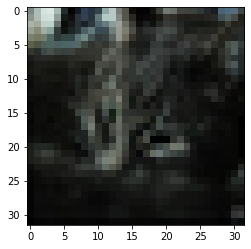

In [259]:
plt.imshow(cifar_x_train[5008].reshape(32,32,3))

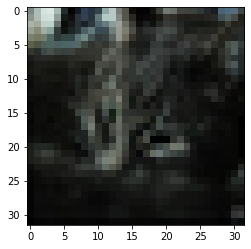

In [260]:
plt.imshow(x_train[5008].reshape(32,32,3))

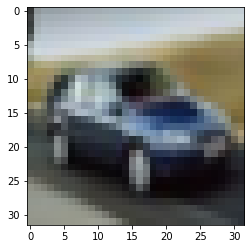

In [216]:
plt.imshow(total_easy[5008].reshape(32,32,3))

In [ ]:
plt.figure(figsize=(20,20))
count = 101
for i in range(0,100,1):
    plt.subplot(10,10,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(total_hard_all[i].reshape(32,32,3), cmap=plt.cm.binary)
    #plt.xlabel(class_names[train_labels[i]])
    #count = count+1
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
count = 101
for i in range(0,100,1):
    plt.subplot(10,10,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(total_reasy_all[i].reshape(32,32,3), cmap=plt.cm.binary)
    #plt.xlabel(class_names[train_labels[i]])
    #count = count+1
plt.show()

In [ ]:


for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

In [88]:
print(len(val_easy_all))
print(len(val_hard_all))

6018
6018


In [67]:
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Activation

from tensorflow.keras import regularizers

input_img = Input(shape=(32, 32,3))
x = Conv2D(32, (3, 3), padding='same')(input_img)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(32, (3, 3), padding='same')(encoded)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(3, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
decoded = Activation('sigmoid')(x)

autoencoder = tf.keras.Model(input_img, decoded)

In [68]:
total_hard_all=np.array(total_hard_all.reshape(-1,32,32,3))
total_easy_all= np.array(total_easy_all.reshape(-1,32,32,3))
val_hard_all= np.array(val_hard_all.reshape(-1,32,32,3))
val_easy_all= np.array(val_easy_all.reshape(-1,32,32,3))


AttributeError: 'list' object has no attribute 'reshape'

In [69]:
total_hard_all=np.array(total_hard_all)
total_hard_all= total_hard_all/255.0
total_easy_all= np.array(total_easy_all)
total_easy_all= total_easy_all/255.0
val_hard_all= np.array(val_hard_all)
val_hard_all=val_hard_all/255.0
val_easy_all=np.array(val_easy_all)
val_easy_all= val_easy_all/255.0


In [70]:
total_hard_all=np.array(total_hard_all.reshape(-1,32,32,3))
total_easy_all= np.array(total_easy_all.reshape(-1,32,32,3))
val_hard_all= np.array(val_hard_all.reshape(-1,32,32,3))
val_easy_all= np.array(val_easy_all.reshape(-1,32,32,3))

In [23]:
total_hard_all=np.array(total_hard_all/255.0)
total_easy_all=total_easy_all/255.0
val_hard_all=val_hard_all/255.0
val_easy_all= val_easy_all/255.0

TypeError: unsupported operand type(s) for /: 'list' and 'float'

In [149]:
total_hard_all=np.array(total_hard_all)
total_easy_all= np.array(total_easy_all)
val_hard_all= np.array(val_hard_all)
val_easy_all=np.array(val_easy_all)

In [150]:
total_hard_all=total_hard_all.reshape(-1,32,32,3)
total_easy_all= total_easy_all.reshape(-1,32,32,3)
val_hard_all= val_hard_all.reshape(-1,32,32,3)
val_easy_all= val_easy_all.reshape(-1,32,32,3)

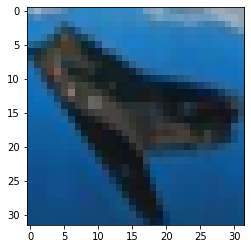

In [192]:

 
plt.imshow(total_easy_all[5200].reshape(32,32,3))
    
    
    

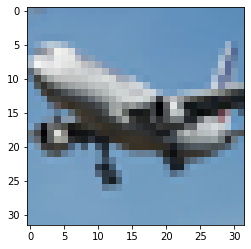

In [191]:
plt.imshow(total_hard_all[5200].reshape(32,32,3))

In [178]:
import random

In [26]:
plt.imshow(total_hard_all[5200].reshape(32,32,3))

NameError: name 'total_hard_all' is not defined

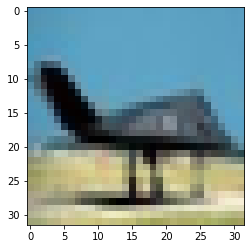

In [107]:
plt.imshow((total_easy_all[502].reshape(32,32,3)))

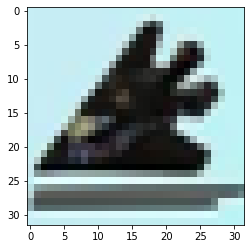

In [124]:
plt.imshow((total_hard_all[501].reshape(32,32,3)))

In [113]:
check = autoencoder.predict(total_easy_all[502].reshape(-1,32,32,3))

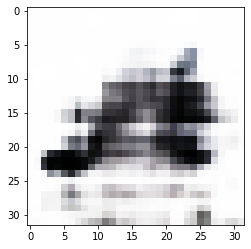

In [114]:
plt.imshow(check.reshape(32,32,3))

In [92]:

#####Autoencoder without normalization
autoencoder.compile(optimizer='adam', loss='categorical_crossentropy')

history = autoencoder.fit(total_easy_all.reshape(len(total_hard_all), 32, 32,3), total_hard_all.reshape(len(total_hard_all),32, 32,3),
                epochs=20,
                batch_size=256,
                shuffle=True,
                validation_data=(val_easy_all.reshape(len(val_easy_all), 32, 32,3), val_hard_all.reshape(len(val_hard_all),32, 32,3)))

Epoch 1/20
71/71 [==============================] - 12s 159ms/step - loss: 1.5621 - val_loss: 1.5622
Epoch 2/20
71/71 [==============================] - 10s 146ms/step - loss: 1.5621 - val_loss: 1.5619
Epoch 3/20
71/71 [==============================] - 10s 146ms/step - loss: 1.5620 - val_loss: 1.5617
Epoch 4/20
71/71 [==============================] - 10s 147ms/step - loss: 1.5620 - val_loss: 1.5603
Epoch 5/20
71/71 [==============================] - 10s 146ms/step - loss: 1.5619 - val_loss: 1.5605
Epoch 6/20
71/71 [==============================] - 10s 147ms/step - loss: 1.5619 - val_loss: 1.5606
Epoch 7/20
71/71 [==============================] - 10s 145ms/step - loss: 1.5618 - val_loss: 1.5603
Epoch 8/20
71/71 [==============================] - 10s 146ms/step - loss: 1.5618 - val_loss: 1.5609
Epoch 9/20
71/71 [==============================] - 10s 147ms/step - loss: 1.5617 - val_loss: 1.5611
Epoch 10/20
71/71 [==============================] - 10s 147ms/step - loss: 1.5617 - val_lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


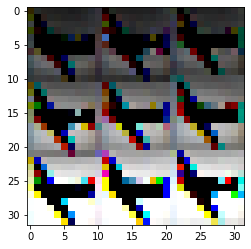

In [64]:
plt.imshow((total_hard_all[1000].reshape(32,32,3)))

In [32]:
from keras.preprocessing.image import ImageDataGenerator

In [33]:
datagen = ImageDataGenerator(width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)

In [35]:
#it_train = datagen.flow(total_easy_all, total_hard_all, batch_size=64)

In [123]:
import numpy
def global_contrast_normalize(X, scale=1., subtract_mean=True, use_std=False,sqrt_bias=0., min_divisor=1e-8):
    """
    Global contrast normalizes by (optionally) subtracting the mean
    across features and then normalizes by either the vector norm
    or the standard deviation (across features, for each example).
    Parameters
    ----------
    X : ndarray, 2-dimensional
        Design matrix with examples indexed on the first axis and \
        features indexed on the second.
    scale : float, optional
        Multiply features by this const.
    subtract_mean : bool, optional
        Remove the mean across features/pixels before normalizing. \
        Defaults to `True`.
    use_std : bool, optional
        Normalize by the per-example standard deviation across features \
        instead of the vector norm. Defaults to `False`.
    sqrt_bias : float, optional
        Fudge factor added inside the square root. Defaults to 0.
    min_divisor : float, optional
        If the divisor for an example is less than this value, \
        do not apply it. Defaults to `1e-8`.
    Returns
    -------
    Xp : ndarray, 2-dimensional
        The contrast-normalized features.
    Notes
    -----
    `sqrt_bias` = 10 and `use_std = True` (and defaults for all other
    parameters) corresponds to the preprocessing used in [1].
    References
    ----------
    .. [1] A. Coates, H. Lee and A. Ng. "An Analysis of Single-Layer
       Networks in Unsupervised Feature Learning". AISTATS 14, 2011.
       http://www.stanford.edu/~acoates/papers/coatesleeng_aistats_2011.pdf
    """
    assert X.ndim == 2, "X.ndim must be 2"
    scale = float(scale)
    assert scale >= min_divisor

    # Note: this is per-example mean across pixels, not the
    # per-pixel mean across examples. So it is perfectly fine
    # to subtract this without worrying about whether the current
    # object is the train, valid, or test set.
    mean = X.mean(axis=1)
    if subtract_mean:
        X = X - mean[:, numpy.newaxis]  # Makes a copy.
    else:
        X = X.copy()

    if use_std:
        # ddof=1 simulates MATLAB's var() behaviour, which is what Adam
        # Coates' code does.
        ddof = 1

        # If we don't do this, X.var will return nan.
        if X.shape[1] == 1:
            ddof = 0

        normalizers = numpy.sqrt(sqrt_bias + X.var(axis=1, ddof=ddof)) / scale
    else:
        normalizers = numpy.sqrt(sqrt_bias + (X ** 2).sum(axis=1)) / scale

    # Don't normalize by anything too small.
    normalizers[normalizers < min_divisor] = 1.

    X /= normalizers[:, numpy.newaxis]  # Does not make a copy.
    return X

In [ ]:
def normalize_data(x):
    data = x
    data = data/255.0
    mean = data.mean(axis=0)
    data -= mean
    ret = global_contrast_normalize(data)
    data = ret.reshape((-1, 3, 32, 32))
    return data

In [175]:
total_hard_all_normalized=normalize_data(total_hard_all.reshape(-1,3072))
total_easy_all_normalized=normalize_data(total_easy_all.reshape(-1,3072))
val_hard_all_normalized=normalize_data(val_hard_all.reshape(-1,3072))
val_easy_all_normalized=normalize_data(val_easy_all.reshape(-1,3072))




In [176]:
print(total_hard_all_normalized.shape)
print(total_easy_all_normalized.shape)
print(val_hard_all_normalized.shape)
print(val_easy_all_normalized.shape)





(18089, 3, 32, 32)
(18089, 3, 32, 32)
(6018, 3, 32, 32)
(6018, 3, 32, 32)


In [177]:
def process_normalized(normalized_data):
    data=[]
    for x in range(0,len(normalized_data)):
        data.append((normalized_data[x]*255).reshape(32,32,3))
        
    return data

In [178]:
total_hard_all_normalized = process_normalized(total_hard_all_normalized)
total_easy_all_normalized = process_normalized(total_easy_all_normalized)
val_hard_all_normalized = process_normalized(val_hard_all_normalized)
val_easy_all_normalized = process_normalized(val_easy_all_normalized)






In [182]:
total_hard_all_normalized= np.array(total_hard_all_normalized)
total_easy_all_normalized= np.array(total_easy_all_normalized)
val_hard_all_normalized= np.array(val_hard_all_normalized)
val_easy_all_normalized= np.array(val_easy_all_normalized)

In [171]:
data= np.array(data)

In [172]:
data.shape

(18089, 32, 32, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


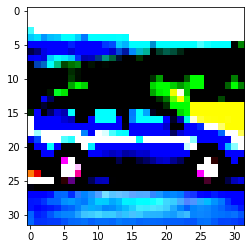

In [179]:
plt.imshow((val_hard_all_normalized[1000]).reshape(32,32,3))


In [183]:
autoencoder.compile(optimizer='adam', loss='categorical_crossentropy')

history = autoencoder.fit(total_hard_all_normalized.reshape(len(total_hard_all_normalized), 32, 32, 3), total_easy_all_normalized.reshape(len(total_easy_all_normalized), 32, 32, 3),
                epochs=100,
                batch_size=256,
                shuffle=True,
                validation_data=(val_hard_all_normalized.reshape(len(val_hard_all_normalized), 32, 32, 3), val_easy_all_normalized.reshape(len(val_easy_all_normalized), 32, 32, 3)))

Epoch 1/100
71/71 [==============================] - 12s 159ms/step - loss: -1.8409 - val_loss: -0.1094
Epoch 2/100
71/71 [==============================] - 10s 147ms/step - loss: -1.9520 - val_loss: -0.2204
Epoch 3/100
71/71 [==============================] - 10s 146ms/step - loss: -1.9925 - val_loss: -0.4931
Epoch 4/100
71/71 [==============================] - 10s 146ms/step - loss: -1.9465 - val_loss: -0.9259
Epoch 5/100
71/71 [==============================] - 10s 145ms/step - loss: -2.0304 - val_loss: -1.1813
Epoch 6/100
71/71 [==============================] - 10s 146ms/step - loss: -2.0084 - val_loss: -1.5751
Epoch 7/100
71/71 [==============================] - 10s 146ms/step - loss: -1.9895 - val_loss: -1.7851
Epoch 8/100
71/71 [==============================] - 10s 145ms/step - loss: -2.0790 - val_loss: -1.9458
Epoch 9/100
71/71 [==============================] - 10s 146ms/step - loss: -2.0532 - val_loss: -1.8277
Epoch 10/100
71/71 [==============================] - 10s 145ms/

In [74]:
x_test.shape

(10000, 32, 32, 3)

In [93]:
decoded_images = autoencoder.predict(cifar_x_test.reshape(cifar_x_test.shape[0],32,32,3))

In [73]:
np.savetxt('cifar10_converted_test_data.txt', decoded_images.reshape(10000,3072))

In [190]:
print(y_test[1000])

5


In [43]:
import os
import sys
import glob
import numpy
import numpy as np
from six.moves import cPickle as pickle
from scipy import linalg
from skimage.color import rgb2luv
from skimage import img_as_float

In [48]:
dirname = "B_net/"

In [44]:
import numpy
def unpickle(file):
    fp = open(file, 'rb')
    if sys.version_info.major == 2:
        data = pickle.load(fp)
    elif sys.version_info.major == 3:
        data = pickle.load(fp, encoding='latin-1')
    fp.close()

    return data

In [49]:
def global_contrast_normalize(X, scale=1., subtract_mean=True, use_std=False,
                              sqrt_bias=0., min_divisor=1e-8):
    """
    Global contrast normalizes by (optionally) subtracting the mean
    across features and then normalizes by either the vector norm
    or the standard deviation (across features, for each example).
    Parameters
    ----------
    X : ndarray, 2-dimensional
        Design matrix with examples indexed on the first axis and \
        features indexed on the second.
    scale : float, optional
        Multiply features by this const.
    subtract_mean : bool, optional
        Remove the mean across features/pixels before normalizing. \
        Defaults to `True`.
    use_std : bool, optional
        Normalize by the per-example standard deviation across features \
        instead of the vector norm. Defaults to `False`.
    sqrt_bias : float, optional
        Fudge factor added inside the square root. Defaults to 0.
    min_divisor : float, optional
        If the divisor for an example is less than this value, \
        do not apply it. Defaults to `1e-8`.
    Returns
    -------
    Xp : ndarray, 2-dimensional
        The contrast-normalized features.
    Notes
    -----
    `sqrt_bias` = 10 and `use_std = True` (and defaults for all other
    parameters) corresponds to the preprocessing used in [1].
    References
    ----------
    .. [1] A. Coates, H. Lee and A. Ng. "An Analysis of Single-Layer
       Networks in Unsupervised Feature Learning". AISTATS 14, 2011.
       http://www.stanford.edu/~acoates/papers/coatesleeng_aistats_2011.pdf
    """
    assert X.ndim == 2, "X.ndim must be 2"
    scale = float(scale)
    assert scale >= min_divisor

    # Note: this is per-example mean across pixels, not the
    # per-pixel mean across examples. So it is perfectly fine
    # to subtract this without worrying about whether the current
    # object is the train, valid, or test set.
    mean = X.mean(axis=1)
    if subtract_mean:
        X = X - mean[:, numpy.newaxis]  # Makes a copy.
    else:
        X = X.copy()

    if use_std:
        # ddof=1 simulates MATLAB's var() behaviour, which is what Adam
        # Coates' code does.
        ddof = 1

        # If we don't do this, X.var will return nan.
        if X.shape[1] == 1:
            ddof = 0

        normalizers = numpy.sqrt(sqrt_bias + X.var(axis=1, ddof=ddof)) / scale
    else:
        normalizers = numpy.sqrt(sqrt_bias + (X ** 2).sum(axis=1)) / scale

    # Don't normalize by anything too small.
    normalizers[normalizers < min_divisor] = 1.

    X /= normalizers[:, numpy.newaxis]  # Does not make a copy.
    return X

In [46]:
import numpy
def get_data(gcn=1,whitening=1):
    data = np.zeros((50000, 3 * 32 * 32), dtype=np.float32)
    labels = np.zeros((50000), dtype=np.uint8)
    for i, data_fn in enumerate(
            sorted(glob.glob(dirname+'datasets/data/cifar10/data_batch*'))):
        batch = unpickle(data_fn)
        data[i * 10000:(i + 1) * 10000] = batch['data']
        labels[i * 10000:(i + 1) * 10000] = batch['labels']
    
    data /= 255
    mean = data.mean(axis=0)
    data -= mean
    
    if gcn==1:
        data = global_contrast_normalize(data,use_std=True)
        
    # if whitening == 1:
    #     components, meanw, data = preprocessing(data)

    data = data.reshape((-1, 3, 32, 32))
    # for i,image in enumerate(data):
    #     data[i] = rgb2luv(img_as_float(image).transpose((1,2,0))).transpose((2,0,1))


    # for i in range(50000):
    #     d = data[i]
    #     d -= d.min()
    #     d /= d.max()
    #     data[i] = d.astype(np.float32)
        
    train_data = data
    train_labels = np.asarray(labels, dtype=np.int32)

    test = unpickle(dirname+'datasets/data/cifar10/test_batch')
    data = np.asarray(test['data'], dtype=np.float32)
    
    data /= 255
    data -= mean

    if gcn==1:
        data = global_contrast_normalize(data,use_std=True)

    # if whitening == 1:
    #     mdata = data - meanw
    #     data = np.dot(mdata, components.T)

    data = data.reshape((-1, 3, 32, 32))
    # for i,image in enumerate(data):
    #     data[i] = rgb2luv(img_as_float(image).transpose((1,2,0))).transpose((2,0,1))


    # for i in range(10000):
    #     d = data[i]
    #     d -= d.min()
    #     d /= d.max()
    #     data[i] = d.astype(np.float32)
        
    test_data = data
    test_labels = np.asarray(test['labels'], dtype=np.int32)

    return train_data, train_labels, test_data, test_labels

In [50]:
x_train_branchy,y_train_branchy,x_test_branchy, y_test_branchy = get_data()

In [281]:
x_train_branchy.shape

(50000, 3, 32, 32)

In [44]:
x_test_branchy.shape

(10000, 3, 32, 32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


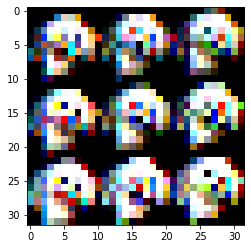

In [65]:
plt.imshow(x_test_branchy[1000].reshape(32,32,3))

In [59]:
decoded_test= decoded_images

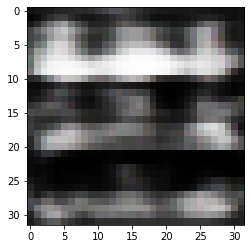

In [60]:
plt.imshow(decoded_test[ ].reshape(32,32,3))

In [11]:

import tensorflow as tf  
 
# Display the version
print(tf.__version__)    
 
# other imports
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, Dense, Flatten, Dropout
from tensorflow.keras.layers import GlobalMaxPooling2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Model

2.8.0


In [91]:
cifar_x_train=x_train
cifar_x_test =x_test
cifar_y_train = y_train
cifar_y_test = y_test

In [92]:
cifar_x_train.shape

(50000, 32, 32, 3)

In [93]:
cifar_x_train, cifar_x_test = x_train / 255.0, x_test / 255.0
 
# flatten the label values
cifar_y_train, cifar_y_test = y_train.flatten(), y_test.flatten()

In [56]:
K = len(set(y_train))
 
# calculate total number of classes
# for output layer
print("number of classes:", K)
 
# Build the model using the functional API
# input layer
i = Input(shape=x_train[0].shape)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(i)
x = BatchNormalization()(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
 
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
 
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
 
x = Flatten()(x)
x = Dropout(0.2)(x)
 
# Hidden layer
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
 
# last hidden layer i.e.. output layer
x = Dense(K, activation='softmax')(x)
 
model = Model(i, x)
 
# model description
model.summary()

number of classes: 10
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 32)        896       
                                                                 
 batch_normalization_10 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_11 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 max_pooling2d (MaxPooling2D  (None, 

In [57]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [58]:
r = model.fit(
  cifar_x_train, cifar_y_train, validation_data=(cifar_x_test, cifar_y_test), epochs=50)

Epoch 1/50


2022-07-06 23:25:57.180989: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 614400000 exceeds 10% of free system memory.


1563/1563 [==============================] - 102s 64ms/step - loss: 1.3112 - accuracy: 0.5456 - val_loss: 0.8844 - val_accuracy: 0.6929
Epoch 2/50
1563/1563 [==============================] - 100s 64ms/step - loss: 0.8426 - accuracy: 0.7065 - val_loss: 0.7803 - val_accuracy: 0.7384
Epoch 3/50
1563/1563 [==============================] - 100s 64ms/step - loss: 0.6956 - accuracy: 0.7612 - val_loss: 0.8113 - val_accuracy: 0.7358
Epoch 4/50
1563/1563 [==============================] - 99s 64ms/step - loss: 0.5869 - accuracy: 0.7968 - val_loss: 0.6494 - val_accuracy: 0.7828
Epoch 5/50
1563/1563 [==============================] - 99s 64ms/step - loss: 0.5021 - accuracy: 0.8279 - val_loss: 0.7858 - val_accuracy: 0.7580
Epoch 6/50
1563/1563 [==============================] - 99s 64ms/step - loss: 0.4325 - accuracy: 0.8504 - val_loss: 0.6052 - val_accuracy: 0.8089
Epoch 7/50
1563/1563 [==============================] - 100s 64ms/step - loss: 0.3568 - accuracy: 0.8770 - val_loss: 0.6388 - val_ac

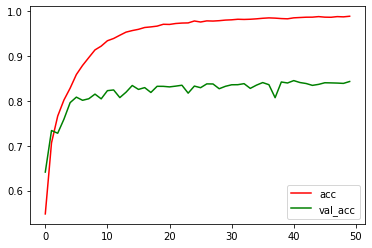

In [17]:
plt.plot(r.history['accuracy'], label='acc', color='red')
plt.plot(r.history['val_accuracy'], label='val_acc', color='green')
plt.legend()

In [36]:
import os


In [44]:
parent_path = os.getcwd()
print(parent_path)
directory= "data"


path = os.path.join(parent_path, directory)
print(path)


/home/hmahmud/.jupyter/branchynet
/home/hmahmud/.jupyter/branchynet/data


In [47]:
if(os.path.exists(path)):
    print("True")
else:
    os.mkdir(path)
    print(path)

True


In [54]:
path

'/home/hmahmud/.jupyter/branchynet/data'

In [55]:
model.save('/home/hmahmud/.jupyter/branchynet/data/cifar10_tensorflow.model')

INFO:tensorflow:Assets written to: /home/hmahmud/.jupyter/branchynet/data/cifar10_tensorflow.model/assets


In [56]:
model.load_weights('/home/hmahmud/.jupyter/branchynet/data/cifar10_tensorflow.model')

2022-06-10 18:03:04.740052: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /home/hmahmud/.jupyter/branchynet/data/cifar10_tensorflow.model: FAILED_PRECONDITION: /home/hmahmud/.jupyter/branchynet/data/cifar10_tensorflow.model; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?


In [57]:
batch_size = 32
score = model.evaluate(cifar_x_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 0.8587 - accuracy: 0.8399
Test loss: 0.8587080836296082
Test accuracy: 0.839900016784668


In [457]:
batch_size = 32
score = model.evaluate(cifar_x_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 3s 10ms/step - loss: 0.9482 - accuracy: 0.8300
Test loss: 0.9481577277183533
Test accuracy: 0.8299999833106995


In [94]:
decoded_images.shape

(10000, 32, 32, 3)

In [95]:
autoencode_test = np.array(decoded_images)

In [96]:
autoencode_test.shape

(10000, 32, 32, 3)

In [97]:
autoencode_test= autoencode_test.reshape(10000,32,32,3)


In [98]:
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 12.3669 - accuracy: 0.1551
Test loss: 12.36685848236084
Test accuracy: 0.1551000028848648


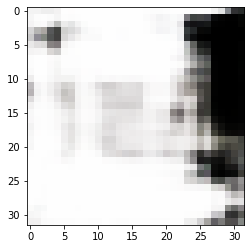

In [118]:
plt.imshow(autoencode_test[1000].reshape(32,32,3))

In [27]:
plt.imshow(total_hard[1000].reshape(32,32,3))

NameError: name 'total_hard' is not defined

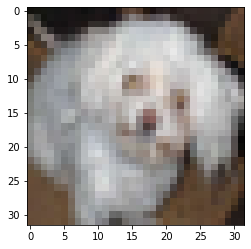

In [123]:
plt.imshow(cifar_x_test[1000].reshape(32,32,3))

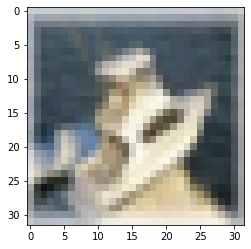

In [214]:
plt.imshow(total_easy_all[15000].reshape(32,32,3))

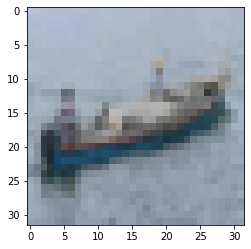

In [213]:
plt.imshow(total_hard_all[15000].reshape(32,32,3))

In [16]:
from tensorflow.keras.layers import ReLU
from tensorflow.keras.layers import Conv2DTranspose

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv2D, Input, Dense, Reshape, Conv2DTranspose,\
   Activation, BatchNormalization, ReLU, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.datasets import cifar100, cifar10

In [48]:
def conv_block(x, filters, kernel_size, strides=2):
   x = Conv2D(filters=filters,
              kernel_size=kernel_size,
              strides=strides,
              padding='same')(x)
   x = BatchNormalization()(x)
   x = ReLU()(x)
   return x
def deconv_block(x, filters, kernel_size):
   x = Conv2DTranspose(filters=filters,
                       kernel_size=kernel_size,
                       strides=2,
                       padding='same')(x)
   x = BatchNormalization()(x)
   x = ReLU()(x)
   return x


def denoising_autoencoder():
   dae_inputs = Input(shape=(32, 32, 3), name='dae_input')
   conv_block1 = conv_block(dae_inputs, 32, 3)
   conv_block2 = conv_block(conv_block1, 64, 3)
   conv_block3 = conv_block(conv_block2, 128, 3)
   conv_block4 = conv_block(conv_block3, 256, 3)
   conv_block5 = conv_block(conv_block4, 256, 3, 1)

   deconv_block1 = deconv_block(conv_block5, 256, 3)
   merge1 = Concatenate()([deconv_block1, conv_block3])
   deconv_block2 = deconv_block(merge1, 128, 3)
   merge2 = Concatenate()([deconv_block2, conv_block2])
   deconv_block3 = deconv_block(merge2, 64, 3)
   merge3 = Concatenate()([deconv_block3, conv_block1])
   deconv_block4 = deconv_block(merge3, 32, 3)

   final_deconv = Conv2DTranspose(filters=3,
                       kernel_size=3,
                       padding='same')(deconv_block4)
   ##change
   #final_deconv1= Dropout(0.25)(final_deconv)

   dae_outputs = Activation('sigmoid', name='dae_output')(final_deconv)
  
   return Model(dae_inputs, dae_outputs, name='dae')

In [49]:
def denoising_autoencoder():
   dae_inputs = Input(shape=(32, 32, 3), name='dae_input')
   conv_block1 = conv_block(dae_inputs, 32, 3)
   conv_block2 = conv_block(conv_block1, 64, 3)
   conv_block3 = conv_block(conv_block2, 128, 3)
   conv_block4 = conv_block(conv_block3, 256, 3)
   conv_block5 = conv_block(conv_block4, 256, 3, 1)

   deconv_block1 = deconv_block(conv_block5, 256, 3)
   merge1 = Concatenate()([deconv_block1, conv_block3])
   deconv_block2 = deconv_block(merge1, 128, 3)
   merge2 = Concatenate()([deconv_block2, conv_block2])
   deconv_block3 = deconv_block(merge2, 64, 3)
   merge3 = Concatenate()([deconv_block3, conv_block1])
   deconv_block4 = deconv_block(merge3, 32, 3)

   final_deconv = Conv2DTranspose(filters=3,
                       kernel_size=3,
                       padding='same')(deconv_block4)
   ##change
   #final_deconv1= Dropout(0.25)(final_deconv)

   dae_outputs = Activation('sigmoid', name='dae_output')(final_deconv)
  
   return Model(dae_inputs, dae_outputs, name='dae')

In [293]:
dae = denoising_autoencoder()
dae.compile(loss='mse', optimizer='adam')

#checkpoint = ModelCheckpoint('best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)

history = dae.fit_generator(it_train,
                epochs=10,
                shuffle=True,
                validation_data=(val_hard.reshape(len(val_hard), 32, 32,3), val_easy.reshape(len(val_easy),32, 32,3)))

Epoch 1/10


/tmp/ipykernel_3678221/896324337.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = dae.fit_generator(it_train,


2078/2078 [==============================] - 180s 85ms/step - loss: 19573.5098 - val_loss: 19549.1523
Epoch 2/10
2078/2078 [==============================] - 209s 100ms/step - loss: 19572.6191 - val_loss: 19549.1504
Epoch 3/10
2078/2078 [==============================] - 212s 102ms/step - loss: 19572.6270 - val_loss: 19549.1504
Epoch 4/10
2078/2078 [==============================] - 222s 107ms/step - loss: 19572.6309 - val_loss: 19549.1504
Epoch 5/10
2078/2078 [==============================] - 222s 107ms/step - loss: 19572.6211 - val_loss: 19549.1504
Epoch 6/10
2078/2078 [==============================] - 222s 107ms/step - loss: 19572.6328 - val_loss: 19549.1504
Epoch 7/10
2078/2078 [==============================] - 222s 107ms/step - loss: 19572.6270 - val_loss: 19549.1504
Epoch 8/10
2078/2078 [==============================] - 222s 107ms/step - loss: 19572.6211 - val_loss: 19549.1504
Epoch 9/10
2078/2078 [==============================] - 226s 109ms/step - loss: 19572.6191 - val_los

In [247]:
import tensorflow.keras as K
import datetime
def decay(epoch):
    """ This method create the alpha"""
    # returning a very small constant learning rate
    return 0.001 / (1 + 1 * 30)

In [650]:
import dill

with open("models/autoencoder_model_secondDisimilar.bn", "rb") as f:
    dae = dill.load(f)

In [651]:
#score=dae.evaluate(x_test,y_test)
# we have changed the name of the layer from input_layer to conv_0
dae.layers[15]._name='encoded'  
#print('Test loss',score[0])
#print('Test accuracy',score[1])

In [652]:
layer_output=dae.get_layer('encoded').output  #get the Output of the Layer
base_encoded=tf.keras.models.Model(inputs=dae.input,outputs=layer_output) #Intermediate model between Input Layer and Output Layer which we are concerned about
#intermediate_prediction=intermediate_model.predict(x_train[image_seq].reshape(1,28,28,1))

In [654]:
Y_p = K.utils.to_categorical(cifar_y_train, 10)
Yv_p = K.utils.to_categorical(cifar_y_test, 10)

In [251]:
cifar_x_train.shape

(50000, 32, 32, 3)

In [257]:
encoder_model.summary()

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_11 (Functional)       (None, 2, 2, 256)         981440    
                                                                 
 up_sampling2d_22 (UpSamplin  (None, 4, 4, 256)        0         
 g2D)                                                            
                                                                 
 flatten_34 (Flatten)        (None, 4096)              0         
                                                                 
 dense_92 (Dense)            (None, 128)               524416    
                                                                 
 dropout_66 (Dropout)        (None, 128)               0         
                                                                 
 dense_93 (Dense)            (None, 128)               16512     
                                                     

In [252]:
import tensorflow.keras as K

In [661]:
temp_x_train=[]
temp_y_train=[]
temp_x_test=[]
temp_y_test=[]
similar_first =[0,1,2,3,7]
similar_2nd= [4,5,6,8,9]
similar_animals=[2,3,4,5,6,7]
similar_machines=[0,1,8,9]

for idx in range(0,len(cifar_x_train)):
    if cifar_y_train[idx:idx+1] in similar_2nd:
        temp_x_train.append(cifar_x_train[idx:idx+1])
        temp_y_train.append(cifar_y_train[idx:idx+1])
        
for idx in range(0,len(cifar_x_test)):
    if cifar_y_test[idx:idx+1] in similar_2nd:
        temp_x_test.append(cifar_x_test[idx:idx+1])
        temp_y_test.append(cifar_y_test[idx:idx+1])
        
temp_x_train= np.array(temp_x_train)
temp_x_train=temp_x_train.reshape(-1,32,32,3)
temp_y_train=np.array(temp_y_train)
temp_x_test= np.array(temp_x_test)
temp_x_test=temp_x_test.reshape(-1,32,32,3)
temp_y_test=np.array(temp_y_test)
#Chnage here
#temp_y_train = K.utils.to_categorical(temp_y_train, 10)
temp_y_train = K.utils.to_categorical(temp_y_train, 10)
temp_y_test = K.utils.to_categorical(temp_y_test, 10)

In [658]:
temp_x_train.shape

(25000, 32, 32, 3)

In [ ]:
###Lats try
Y_p = K.utils.to_categorical(cifar_y_train, 10)
Yv_p = K.utils.to_categorical(cifar_y_test, 10)

In [664]:
encoder_model= K.Sequential()
# using upsamplign to get more data points and improve the predictions
#encoder_model.add(K.layers.UpSampling2D())
encoder_model.add(base_encoded)
encoder_model.add(K.layers.UpSampling2D())
encoder_model.add(K.layers.Flatten())
encoder_model.add(K.layers.Dense(128, activation=('relu')))
encoder_model.add(K.layers.Dropout(0.2))
encoder_model.add(K.layers.Dense(128, activation=('relu')))
encoder_model.add(K.layers.Dropout(0.2))
encoder_model.add(K.layers.Dense(10, activation=('softmax')))
# adding callbacks
callback = []
callback += [K.callbacks.LearningRateScheduler(decay, verbose=0)]
#callback += [K.callbacks.ModelCheckpoint('cifar10.h5',
#                                         save_best_only=True,
#                                        mode='min'
#                                         )]
# tensorboard callback
# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# callback += [K.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)]
# Compiling model with adam optimizer and looking the accuracy
datagen = ImageDataGenerator(width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
it_train_alex = datagen.flow(temp_x_train, temp_y_train, batch_size=64)
encoder_model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
# training model with mini batch using shuffle data
rs=encoder_model.fit(it_train_alex,
batch_size=128,
validation_data=(temp_x_test, temp_y_test),
epochs=100, shuffle=True,
callbacks=callback,
verbose=1
)

Epoch 1/100
391/391 [==============================] - 18s 44ms/step - loss: 0.7519 - accuracy: 0.8080 - val_loss: 0.2691 - val_accuracy: 0.9188 - lr: 3.2258e-05
Epoch 2/100
391/391 [==============================] - 17s 44ms/step - loss: 0.1476 - accuracy: 0.9608 - val_loss: 0.2600 - val_accuracy: 0.9216 - lr: 3.2258e-05
Epoch 3/100
391/391 [==============================] - 17s 44ms/step - loss: 0.0941 - accuracy: 0.9728 - val_loss: 0.2731 - val_accuracy: 0.9242 - lr: 3.2258e-05
Epoch 4/100
391/391 [==============================] - 17s 44ms/step - loss: 0.0705 - accuracy: 0.9793 - val_loss: 0.2831 - val_accuracy: 0.9238 - lr: 3.2258e-05
Epoch 5/100
391/391 [==============================] - 17s 44ms/step - loss: 0.0562 - accuracy: 0.9840 - val_loss: 0.2969 - val_accuracy: 0.9256 - lr: 3.2258e-05
Epoch 6/100
391/391 [==============================] - 16s 42ms/step - loss: 0.0487 - accuracy: 0.9861 - val_loss: 0.3144 - val_accuracy: 0.9252 - lr: 3.2258e-05
Epoch 7/100
391/391 [=======

In [532]:

temp_x_test=[]
temp_y_test=[]
similar_first =[0,1,2,3,7]
similar_2nd= [4,5,6,8,9]
similar_animals=[2,3,4,5,6,7]
similar_machines=[0,1,8,9]


for idx in range(0,len(cifar_x_test)):
    if cifar_y_test[idx:idx+1] in similar_first:
        temp_x_test.append(cifar_x_test[idx:idx+1])
        temp_y_test.append(cifar_y_test[idx:idx+1])
        
temp_x_test= np.array(temp_x_test)
temp_x_test=temp_x_test.reshape(-1,32,32,3)
temp_y_test=np.array(temp_y_test)
        

In [533]:
temp_y = K.utils.to_categorical(temp_y_test, 10)

In [534]:
###300 epoch second dissimilar group 
batch_size = 32
score = model_first.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 1s 6ms/step - loss: 0.5977 - accuracy: 0.8930
Test loss: 0.5977225303649902
Test accuracy: 0.8930000066757202


In [274]:
with open("models/firstgroup_classifier.bn", "rb") as f:
    model_first=dill.load(f)

In [273]:

with open("models/secondgroup_classifier.bn", "rb") as f:
    model_second=dill.load(f)

In [536]:
entropy_value_second[1000]

9.058541e-11

In [548]:
Data=np.array(cifar_x_test)
xdata = Data.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
softmax_data1 = model_first.predict(xdata)
#print(softmax_data)
entropy_value_first = np.array([entropy(s) for s in softmax_data1])
softmax_data2 = model_second.predict(xdata)
#print(softmax_data)
entropy_value_second = np.array([entropy(s) for s in softmax_data2])

model_first_x_data=[]
model_first_y_data=[]
model_second_x_data=[]
model_second_y_data=[]
miss_predicted_autoencoder_first=[]
miss_predicted_autoencoder_second=[]
miss_predicted_autoencoder_first_index=[]
miss_predicted_autoencoder_second_index=[]




#entropy_value_first[idx]>entropy_value_second[idx] and 
#max_probability_first[idx]>max_probability_second[idx]

for idx in range(0, len(cifar_x_test)):
    if(entropy_value_first[idx]>=entropy_value_second[idx] and cifar_y_test[idx:idx+1] not in similar_2nd):
        miss_predicted_autoencoder_second.append(entropy_value_second[idx])
        miss_predicted_autoencoder_second_index.append(idx)
        miss_predicted_autoencoder_first.append(entropy_value_first[idx])
        
    if(entropy_value_first[idx]<entropy_value_second[idx] and cifar_y_test[idx:idx+1] not in similar_first):
        miss_predicted_autoencoder_second.append(entropy_value_second[idx])
        miss_predicted_autoencoder_first_index.append(idx)
        miss_predicted_autoencoder_first.append(entropy_value_first[idx])
        
        
        
        
        


for idx in range(0, len(cifar_x_test)):
    max_dif=abs(max_probability_first[idx]-max_probability_second[idx])
    entro_dif=abs(entropy_value_first[idx]-entropy_value_second[idx])
          
        
    
    if(entropy_value_first[idx]>=entropy_value_second[idx] and max_probability_first[idx]<=max_probability_second[idx]):
        model_second_x_data.append(cifar_x_test[idx:idx+1])
        model_second_y_data.append(cifar_y_test[idx:idx+1])
        
    elif(entropy_value_first[idx]>entropy_value_second[idx] and max_probability_first[idx]>max_probability_second[idx]):
        if(max_dif>entro_dif):
            model_first_x_data.append(cifar_x_test[idx:idx+1])
            model_first_y_data.append(cifar_y_test[idx:idx+1])
        else:
            model_second_x_data.append(cifar_x_test[idx:idx+1])
            model_second_y_data.append(cifar_y_test[idx:idx+1])
            
    elif(entropy_value_first[idx]<entropy_value_second[idx] and max_probability_first[idx]<max_probability_second[idx]):
        if(max_dif>entro_dif):
            model_second_x_data.append(cifar_x_test[idx:idx+1])
            model_second_y_data.append(cifar_y_test[idx:idx+1])
            
        else:
            model_first_x_data.append(cifar_x_test[idx:idx+1])
            model_first_y_data.append(cifar_y_test[idx:idx+1])
            
            
    #elif(entropy_value_first[idx]<entropy_value_second[idx] and max_probability_first[idx]>max_probability_second[idx)
            
            
            
        
        
    else:    
        model_first_x_data.append(cifar_x_test[idx:idx+1])
        model_first_y_data.append(cifar_y_test[idx:idx+1])
        #print("here")
        
        
model_first_x_data=np.array(model_first_x_data)
#print(type(model_first_x_data))
#print(model_first_x_data.shape)
model_first_x_data=model_first_x_data.reshape(-1,32,32,3)
print(model_first_x_data.shape)
model_first_y_data=np.array(model_first_y_data)
first_y=K.utils.to_categorical(model_first_y_data, 10)
        
model_second_x_data=np.array(model_second_x_data)
model_second_x_data=model_second_x_data.reshape(-1,32,32,3)
print(model_second_x_data.shape)
model_second_y_data=np.array(model_second_y_data)
second_y=K.utils.to_categorical(model_second_y_data, 10)


batch_size = 128
score1 = model_first.evaluate(model_first_x_data, first_y, batch_size=batch_size, verbose=1)
score2 = model_second.evaluate(model_second_x_data, second_y, batch_size=batch_size, verbose=1)



accuarcy = (((score1[1]*len(model_first_x_data))+(score2[1])*len(model_second_x_data))/len(cifar_x_test))

print("Overall accuracy with both autoencoder is : ",accuarcy )

(4755, 32, 32, 3)
(5245, 32, 32, 3)
41/41 [==============================] - 0s 6ms/step - loss: 4.1540 - accuracy: 0.7300
Overall accuracy with both autoencoder is :  0.7377999767959118


In [549]:
dat = numpy.array([miss_predicted_autoencoder_first, miss_predicted_autoencoder_second])

dat = dat.T

numpy.savetxt('missed.txt', dat, delimiter = '  ,   ')

In [320]:
model_second.predict(model_first_x_data[100:101])

array([[1.0592331e-04, 1.3197194e-05, 1.7489610e-05, 8.2872157e-06,
        3.2317955e-06, 9.4771379e-01, 5.2011095e-02, 9.2736013e-07,
        2.2197566e-05, 1.0381881e-04]], dtype=float32)

In [405]:
model_first.predict(cifar_x_test[2003:2004])

array([[5.7603205e-07, 2.5070897e-06, 7.2007747e-06, 9.9998093e-01,
        1.5200424e-06, 3.5575289e-07, 9.0248415e-07, 3.5970461e-06,
        9.2358471e-07, 1.4369926e-06]], dtype=float32)

In [406]:

np.max(model_first.predict(cifar_x_test[2003:2004]))

0.9999809

In [407]:
Yv_p[2003:2004]

array([[0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]], dtype=float32)

In [408]:
model_second.predict(cifar_x_test[2003:2004])

array([[2.1160015e-06, 5.8105499e-08, 5.6343652e-07, 2.0335040e-07,
        9.4786856e-06, 9.9998045e-01, 3.8182516e-06, 1.2023658e-08,
        2.8345109e-08, 3.3127478e-06]], dtype=float32)

In [409]:
np.max(model_second.predict(cifar_x_test[2003:2004]))

0.99998045

In [411]:
model_second.evaluate(cifar_x_test[2003:2004],Yv_p[2003:2004])

1/1 [==============================] - 0s 27ms/step - loss: 1.9550e-05 - accuracy: 1.0000


[1.9550132492440753e-05, 1.0]

In [412]:
model_first.evaluate(cifar_x_test[2003:2004],Yv_p[2003:2004])

1/1 [==============================] - 0s 27ms/step - loss: 14.8490 - accuracy: 0.0000e+00


[14.849029541015625, 0.0]

In [413]:
entropy_value_first[2003:2004]

array([0.00026035], dtype=float32)

In [414]:
entropy_value_second[2003:2004]

array([0.00025919], dtype=float32)

In [256]:
###300 epoch first dissimilar group 
batch_size = 32
score = encoder_model.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 1s 6ms/step - loss: 0.5977 - accuracy: 0.8930
Test loss: 0.5977225303649902
Test accuracy: 0.8930000066757202


In [258]:
import dill
with open("models/firstgroup_classifier.bn", "wb") as f:
    dill.dump(encoder_model,f)

INFO:tensorflow:Assets written to: ram://3ba3eba9-785a-44ec-ae48-d14ff68cb4f3/assets


In [242]:
###100 epoch first dissimilar group 
batch_size = 32
score = encoder_model.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])   

157/157 [==============================] - 1s 6ms/step - loss: 0.6038 - accuracy: 0.8878
Test loss: 0.603848934173584
Test accuracy: 0.8877999782562256


In [199]:
######training with same datagroup (second dissimilar group)
batch_size = 32
score = encoder_model.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 1s 6ms/step - loss: 0.5446 - accuracy: 0.9124
Test loss: 0.544566810131073
Test accuracy: 0.9124000072479248


In [205]:
#############training with same datagroup (first dissimilar group)
batch_size = 32
score = encoder_model.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 1s 6ms/step - loss: 0.6689 - accuracy: 0.8334
Test loss: 0.6688578724861145
Test accuracy: 0.8334000110626221


In [218]:
#############training with same datagroup (Animals group)
batch_size = 32
score = encoder_model.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

188/188 [==============================] - 1s 6ms/step - loss: 0.9928 - accuracy: 0.7563
Test loss: 0.9927635788917542
Test accuracy: 0.7563333511352539


In [230]:
#############training with same datagroup (Machines group)
batch_size = 32
score = encoder_model.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

125/125 [==============================] - 1s 6ms/step - loss: 0.5591 - accuracy: 0.9005
Test loss: 0.5591309070587158
Test accuracy: 0.9004999995231628


In [185]:
######second similar group based autoencoder and using whole training data
batch_size = 32
score = encoder_model.evaluate(temp_x_test, temp_y, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 1s 5ms/step - loss: 0.7741 - accuracy: 0.7724
Test loss: 0.774071455001831
Test accuracy: 0.7724000215530396


In [88]:
batch_size = 32
score = encoder_model.evaluate(cifar_x_test, Yv_p, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 6ms/step - loss: 0.1380 - accuracy: 0.8257
Test loss: 0.13800792396068573
Test accuracy: 0.8256999850273132


In [115]:
batch_size = 32
score = encoder_model.evaluate(cifar_x_test, Yv_p, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 6ms/step - loss: 0.1387 - accuracy: 0.8206
Test loss: 0.1387142390012741
Test accuracy: 0.8205999732017517


In [308]:
##################compressed#####################
batch_size = 32
score = encoder_model.evaluate(cifar_x_test, Yv_p, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 6ms/step - loss: 1.2778 - accuracy: 0.8115
Test loss: 1.2777775526046753
Test accuracy: 0.8115000128746033


In [24]:
batch_size = 32
score = encoder_model.evaluate(cifar_x_test, Yv_p, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 5ms/step - loss: 0.9177 - accuracy: 0.8182
Test loss: 0.9176796674728394
Test accuracy: 0.8181999921798706


In [26]:
encoder_model_alexNet= keras.Sequential()

In [25]:
import keras

In [29]:
import tensorflow.keras.backend as K

In [19]:
import tensorflow.keras as K
from keras.preprocessing.image import ImageDataGenerator

In [304]:
encoder_model_alexNet= K.Sequential()
# using upsamplign to get more data points and improve the predictions
#encoder_model.add(K.layers.UpSampling2D())
encoder_model_alexNet.add(base_encoded)
encoder_model_alexNet.add(K.layers.Flatten())
encoder_model_alexNet.add(BatchNormalization())
#encoder_model_alexNet.add(MaxPooling2D(pool_size=(2, 2), strides=2))
#model.add(Activation('relu'))
encoder_model_alexNet.add(K.layers.Dropout(0.25))  
#encoder_model_alexNet.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
#model.add(Activation('relu'))
#encoder_model_alexNet.add(MaxPooling2D(pool_size=(2, 2), strides=2))
encoder_model_alexNet.add(K.layers.Dropout(0.15))
encoder_model_alexNet.add(K.layers.Flatten())
encoder_model_alexNet.add(Dense(1024))
encoder_model_alexNet.add(BatchNormalization())
encoder_model_alexNet.add(Dense(512))
encoder_model_alexNet.add(BatchNormalization())
encoder_model_alexNet.add(Activation('relu'))
encoder_model_alexNet.add(K.layers.Dropout(0.25))
encoder_model_alexNet.add(BatchNormalization())
encoder_model_alexNet.add(Dense(256))
encoder_model_alexNet.add(BatchNormalization())
encoder_model_alexNet.add(Activation('tanh'))
encoder_model_alexNet.add(K.layers.Dropout(0.25))
encoder_model_alexNet.add(Dense(10, activation='softmax'))
# adding callbacks
callback = []
callback += [K.callbacks.LearningRateScheduler(decay, verbose=1)]
#callback += [K.callbacks.ModelCheckpoint('cifar10.h5',
#                                         save_best_only=True,
#                                        mode='min'
#                                         )]
# tensorboard callback
# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# callback += [K.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)]
# Compiling model with adam optimizer and looking the accuracy
#encoder_model_alexNet.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
opt = SGD(lr=0.001, momentum=0.9)
encoder_model_alexNet.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
# training model with mini batch using shuffle data
datagen = ImageDataGenerator(width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
it_train_alex = datagen.flow(temp_x_train, temp_y_train, batch_size=64)
#fit_generator
rs1=encoder_model_alexNet.fit(temp_x_train,temp_y_train,
validation_data=(temp_x_test, temp_y),
epochs=100, shuffle=True,
callbacks=callback,
verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 1/100
782/782 [==============================] - 21s 25ms/step - loss: 0.4813 - accuracy: 0.8664 - val_loss: 0.2702 - val_accuracy: 0.9190 - lr: 3.2258e-05

Epoch 2: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 2/100
782/782 [==============================] - 19s 25ms/step - loss: 0.1539 - accuracy: 0.9550 - val_loss: 0.2625 - val_accuracy: 0.9216 - lr: 3.2258e-05

Epoch 3: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 3/100
782/782 [==============================] - 19s 24ms/step - loss: 0.1145 - accuracy: 0.9640 - val_loss: 0.2688 - val_accuracy: 0.9242 - lr: 3.2258e-05

Epoch 4: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 4/100
782/782 [==============================] - 19s 24ms/step - loss: 0.0979 - accuracy: 0.9690 - val_loss: 0.2707 - val_accuracy: 0.9250 - lr: 3.2258e-05

Epoch 5: LearningRateSchedu

KeyboardInterrupt: 

In [337]:
batch_size = 32
score = encoder_model_alexNet.evaluate(cifar_x_test, Yv_p, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 0.6753 - accuracy: 0.8234
Test loss: 0.6753145456314087
Test accuracy: 0.8234000205993652


In [22]:
batch_size = 32
score = encoder_model_alexNet.evaluate(cifar_x_test, Yv_p, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 0.5775 - accuracy: 0.8100
Test loss: 0.5775220990180969
Test accuracy: 0.8100000023841858


In [437]:
encoder_model_alexNet1= K.Sequential()
# using upsamplign to get more data points and improve the predictions
#encoder_model.add(K.layers.UpSampling2D())
encoder_model_alexNet1.add(base_encoded)
encoder_model_alexNet1.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
#encoder_model_alexNet.add(MaxPooling2D(pool_size=(2, 2), strides=2))
encoder_model_alexNet1.add(MaxPooling2D((2, 2)))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(K.layers.Dropout(0.25))
encoder_model_alexNet1.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
#encoder_model_alexNet.add(MaxPooling2D(pool_size=(2, 2), strides=2))

encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(K.layers.Dropout(0.25))
encoder_model_alexNet1.add(BatchNormalization())
#encoder_model_alexNet1.add(K.layers.Flatten())
#encoder_model_alexNet1.add(BatchNormalization())

#model.add(Activation('relu'))
#encoder_model_alexNet1.add(K.layers.Dropout(0.25))  
#encoder_model_alexNet.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
#model.add(Activation('relu'))
#encoder_model_alexNet.add(MaxPooling2D(pool_size=(2, 2), strides=2))
encoder_model_alexNet1.add(K.layers.Dropout(0.15))
encoder_model_alexNet1.add(K.layers.Flatten())
encoder_model_alexNet1.add(Dense(1024))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(Dense(512))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(Activation('relu'))
encoder_model_alexNet1.add(K.layers.Dropout(0.25))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(Dense(256))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(Activation('tanh'))
encoder_model_alexNet1.add(K.layers.Dropout(0.25))
encoder_model_alexNet1.add(Dense(10, activation='softmax'))
# adding callbacks
callback = []
callback += [K.callbacks.LearningRateScheduler(decay, verbose=1)]
#callback += [K.callbacks.ModelCheckpoint('cifar10.h5',
#                                         save_best_only=True,
#                                        mode='min'
#                                         )]
# tensorboard callback
# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# callback += [K.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)]
# Compiling model with adam optimizer and looking the accuracy
encoder_model_alexNet1.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
#opt = SGD(lr=0.001, momentum=0.9)
#encoder_model_alexNet1.compile(optimizer=opt, loss='categorical_crossentropy',metrics=['accuracy'])
# training model with mini batch using shuffle data
it_train_alex = datagen.flow(temp_x_train, temp_y_train, batch_size=64)
rs1=encoder_model_alexNet1.fit(it_train_alex,
validation_data=(temp_x_test, temp_y),
epochs=30, shuffle=True,
callbacks=callback,
verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 1/30
391/391 [==============================] - 21s 48ms/step - loss: 1.2166 - accuracy: 0.6075 - val_loss: 0.4010 - val_accuracy: 0.8746 - lr: 3.2258e-05

Epoch 2: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 2/30
391/391 [==============================] - 18s 47ms/step - loss: 0.4500 - accuracy: 0.8614 - val_loss: 0.3440 - val_accuracy: 0.9002 - lr: 3.2258e-05

Epoch 3: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 3/30
391/391 [==============================] - 18s 46ms/step - loss: 0.3149 - accuracy: 0.9005 - val_loss: 0.3354 - val_accuracy: 0.9048 - lr: 3.2258e-05

Epoch 4: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 4/30
391/391 [==============================] - 18s 47ms/step - loss: 0.2476 - accuracy: 0.9216 - val_loss: 0.3257 - val_accuracy: 0.9090 - lr: 3.2258e-05

Epoch 5: LearningRateScheduler 

In [307]:
encoder_model_alexNet1= K.Sequential()
# using upsamplign to get more data points and improve the predictions
#encoder_model.add(K.layers.UpSampling2D())
encoder_model_alexNet1.add(base_encoded)
encoder_model_alexNet1.add(K.layers.UpSampling2D())
encoder_model_alexNet1.add(K.layers.UpSampling2D())

encoder_model_alexNet1.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(MaxPooling2D((2, 2)))
encoder_model_alexNet1.add(K.layers.Dropout(0.2))
encoder_model_alexNet1.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(MaxPooling2D((2, 2)))
encoder_model_alexNet1.add(K.layers.Dropout(0.3))
encoder_model_alexNet1.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(MaxPooling2D((2, 2)))
encoder_model_alexNet1.add(K.layers.Dropout(0.4))
encoder_model_alexNet1.add(K.layers.Flatten())
encoder_model_alexNet1.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
encoder_model_alexNet1.add(BatchNormalization())
encoder_model_alexNet1.add(K.layers.Dropout(0.5))
encoder_model_alexNet1.add(Dense(10, activation='softmax'))
# adding callbacks
callback = []
callback += [K.callbacks.LearningRateScheduler(decay, verbose=1)]
#callback += [K.callbacks.ModelCheckpoint('cifar10.h5',
#                                         save_best_only=True,
#                                        mode='min'
#                                         )]
# tensorboard callback
# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# callback += [K.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)]
# Compiling model with adam optimizer and looking the accuracy
encoder_model_alexNet1.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
#opt = SGD(lr=0.001, momentum=0.9)
#encoder_model_alexNet1.compile(optimizer=opt, loss='categorical_crossentropy',metrics=['accuracy'])
# training model with mini batch using shuffle data
it_train_alex = datagen.flow(temp_x_train, temp_y_train, batch_size=64)
rs1=encoder_model_alexNet1.fit(it_train_alex,
validation_data=(temp_x_test, temp_y),
epochs=30, shuffle=True,
callbacks=callback,
verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 1/30
391/391 [==============================] - 21s 50ms/step - loss: 2.7839 - accuracy: 0.2065 - val_loss: 1.2544 - val_accuracy: 0.6714 - lr: 3.2258e-05

Epoch 2: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 2/30
391/391 [==============================] - 19s 50ms/step - loss: 1.4156 - accuracy: 0.5405 - val_loss: 0.5169 - val_accuracy: 0.8732 - lr: 3.2258e-05

Epoch 3: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 3/30
391/391 [==============================] - 19s 49ms/step - loss: 0.6926 - accuracy: 0.7992 - val_loss: 0.3749 - val_accuracy: 0.8986 - lr: 3.2258e-05

Epoch 4: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 4/30
391/391 [==============================] - 19s 49ms/step - loss: 0.4133 - accuracy: 0.8919 - val_loss: 0.3455 - val_accuracy: 0.9092 - lr: 3.2258e-05

Epoch 5: LearningRateScheduler 

In [442]:
batch_size = 32
score = encoder_model_alexNet1.evaluate(cifar_x_test, Yv_p, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 3s 8ms/step - loss: 1.2549 - accuracy: 0.8112
Test loss: 1.2549408674240112
Test accuracy: 0.8112000226974487


In [333]:
from tensorflow.keras.optimizers import SGD

In [308]:
encoder_model_alexNet1.summary()

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_13 (Functional)       (None, 2, 2, 256)         981440    
                                                                 
 up_sampling2d_26 (UpSamplin  (None, 4, 4, 256)        0         
 g2D)                                                            
                                                                 
 up_sampling2d_27 (UpSamplin  (None, 8, 8, 256)        0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 8, 8, 32)          73760     
                                                                 
 batch_normalization_36 (Bat  (None, 8, 8, 32)         128       
 chNormalization)                                                
                                                     

In [444]:
encoder_model_alexNet.summary()

ValueError: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data.

In [ ]:
def AlexnetModel_01(input_shape,num_classes):
    model = Sequential()
    model.add(Convolution2D(64, (4, 4), padding='same', input_shape=input_shape, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))
    model.add(Dropout(0.25))
    model.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
    #model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))
    model.add(Dropout(0.15))
    model.add(Flatten())
    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64))
    model.add(Activation('tanh'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))
    
    return model

In [770]:
def compressed_autoencoder():
   dae_inputs = Input(shape=(32, 32, 3), name='dae_input')
   conv_block1 = conv_block(dae_inputs , 32, 3)
   conv_block2 = conv_block(conv_block1, 64, 3)
   conv_block3 = conv_block(conv_block2, 128, 3)
   conv_block4 = conv_block(conv_block3, 256, 3)
   conv_block5 = conv_block(conv_block4, 256, 3, 1)
   #classifier = Dense(nb_classes, activation='softmax')(encoded)
   dae_outputs = Activation('sigmoid', name='dae_output')(conv_block5)
   #autoencoder = Model(dae_inputs, conv_block5)
   return Model(dae_inputs, dae_outputs ,name='dae2')

In [774]:
dae2.summary()

Model: "dae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dae_input (InputLayer)      [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_173 (Conv2D)         (None, 16, 16, 32)        896       
                                                                 
 batch_normalization_271 (Ba  (None, 16, 16, 32)       128       
 tchNormalization)                                               
                                                                 
 re_lu_254 (ReLU)            (None, 16, 16, 32)        0         
                                                                 
 conv2d_174 (Conv2D)         (None, 8, 8, 64)          18496     
                                                                 
 batch_normalization_272 (Ba  (None, 8, 8, 64)         256       
 tchNormalization)                                             

In [772]:
dae2 = compressed_autoencoder()
dae2.compile(loss='mse', optimizer='adam')

In [773]:
compressed = compressed_autoencoder()
compressed.compile(loss='mse', optimizer='adam')

#checkpoint = ModelCheckpoint('best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)

history = dae2.fit_generator(it_train,
                epochs=10,
                shuffle=True,
                validation_data=(val_hard.reshape(len(val_hard), 32, 32,3), val_easy.reshape(len(val_easy),32, 32,3)))

Epoch 1/10


/tmp/ipykernel_3728274/3553885144.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = dae2.fit_generator(it_train,


InvalidArgumentError: Graph execution error:

Detected at node 'mean_squared_error/SquaredDifference' defined at (most recent call last):
    File "/usr/lib/python3.8/runpy.py", line 194, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.8/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_new_instance()
    File "/home/hmahmud/.local/lib/python3.8/site-packages/traitlets/config/application.py", line 846, in launch_instance
      app.start()
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 677, in start
      self.io_loop.start()
    File "/home/hmahmud/.local/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 199, in start
      self.asyncio_loop.run_forever()
    File "/usr/lib/python3.8/asyncio/base_events.py", line 570, in run_forever
      self._run_once()
    File "/usr/lib/python3.8/asyncio/base_events.py", line 1859, in _run_once
      handle._run()
    File "/usr/lib/python3.8/asyncio/events.py", line 81, in _run
      self._context.run(self._callback, *self._args)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 461, in dispatch_queue
      await self.process_one()
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 450, in process_one
      await dispatch(*args)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 357, in dispatch_shell
      await result
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 652, in execute_request
      reply_content = await reply_content
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel/ipkernel.py", line 359, in do_execute
      res = shell.run_cell(code, store_history=store_history, silent=silent)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/ipykernel/zmqshell.py", line 532, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 2768, in run_cell
      result = self._run_cell(
    File "/home/hmahmud/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 2814, in _run_cell
      return runner(coro)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3012, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/hmahmud/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3191, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/hmahmud/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3251, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_3728274/3553885144.py", line 6, in <module>
      history = dae2.fit_generator(it_train,
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 2209, in fit_generator
      return self.fit(
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
      return fn(*args, **kwargs)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1384, in fit
      tmp_logs = self.train_function(iterator)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1021, in train_function
      return step_function(self, iterator)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1010, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1000, in run_step
      outputs = model.train_step(data)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 860, in train_step
      loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 918, in compute_loss
      return self.compiled_loss(
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/compile_utils.py", line 201, in __call__
      loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/losses.py", line 141, in __call__
      losses = call_fn(y_true, y_pred)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/losses.py", line 245, in call
      return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/losses.py", line 1329, in mean_squared_error
      return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)
Node: 'mean_squared_error/SquaredDifference'
Incompatible shapes: [64,32,32,3] vs. [64,2,2,256]
	 [[{{node mean_squared_error/SquaredDifference}}]] [Op:__inference_train_function_36403323]

In [95]:
import dill
with open("models/autoencoder_model_entro.bn", "wb") as f:
    dill.dump(dae,f)

2022-06-26 10:05:43.779246: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ram://89e3c03c-4174-4014-b13f-1f18164b4148/assets


In [454]:
def add_noise_and_clip_data(data):
   noise = np.random.normal(loc=0.0, scale=0.1, size=data.shape)
   data = data + noise
   data = np.clip(data, 0., 1.)
   return data

In [3]:
import dill
with open("models/autoencoder_model_entro_latest1.bn", "rb") as f:
         denoise_auto = dill.load(f)

2022-09-26 16:50:33.635409: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudnn.so.8'; dlerror: libcudnn.so.8: cannot open shared object file: No such file or directory
2022-09-26 16:50:33.635448: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1850] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2022-09-26 16:50:33.635847: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [13]:

######Hasan################################################################
######################################################
######################################################
################################################




decoded_images_2nd = denoise_auto.predict(cifar_x_test.reshape(cifar_x_test.shape[0],32,32,3))
autoencode_test2 = np.array(decoded_images_2nd)
autoencode_test2= autoencode_test2.reshape(-1,32,32,3)
batch_size = 32
score = model.evaluate(autoencode_test2, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 4s 12ms/step - loss: 7.7243 - accuracy: 0.8088
Test loss: 7.724292278289795
Test accuracy: 0.8087999820709229


In [455]:
train_data_noisy =  add_noise_and_clip_data(cifar_x_train)
train_data_clean =  cifar_x_train

test_data_noisy = add_noise_and_clip_data(cifar_x_test)
test_data_clean=  cifar_x_test

In [524]:
it_train1 = datagen.flow(train_data_noisy, train_data_clean, batch_size=64)

In [544]:
##params: 
dae1 = denoising_autoencoder()
dae1.compile(loss='mse', optimizer='adam')

#checkpoint = ModelCheckpoint('best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)

history = dae1.fit(train_data_noisy,
                train_data_clean ,
                epochs=100 ,
                shuffle=True,
                validation_data=(test_data_noisy.reshape(len(test_data_noisy),32,32,3), test_data_clean.reshape(len(test_data_clean),32,32,3)))

Epoch 1/100
1563/1563 [==============================] - 57s 36ms/step - loss: 0.0034 - val_loss: 0.0024
Epoch 2/100
1563/1563 [==============================] - 56s 36ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 3/100
1563/1563 [==============================] - 56s 36ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 4/100
1563/1563 [==============================] - 56s 36ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 5/100
1563/1563 [==============================] - 56s 36ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 6/100
1563/1563 [==============================] - 56s 36ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 7/100
1563/1563 [==============================] - 55s 35ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 8/100
1563/1563 [==============================] - 56s 36ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 9/100
1563/1563 [==============================] - 56s 36ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 10/100
1563/1563 [==============================]

In [545]:
decoded_images_2nd = dae1.predict(autoencode_test.reshape(autoencode_test.shape[0],32,32,3))

In [546]:
decoded_images_2nd.shape

(10000, 32, 32, 3)

In [547]:
autoencode_test2 = np.array(decoded_images_2nd)

In [548]:
autoencode_test2.shape

(10000, 32, 32, 3)

In [549]:
autoencode_test2= autoencode_test2.reshape(-1,32,32,3)

In [550]:
batch_size = 32
score = model.evaluate(autoencode_test2, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 5.6738 - accuracy: 0.7653
Test loss: 5.673835754394531
Test accuracy: 0.7652999758720398


In [567]:
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 8.2558 - accuracy: 0.7860
Test loss: 8.255831718444824
Test accuracy: 0.7860000133514404


In [235]:
dae.layers[15]

In [236]:
for layer in dae.layers:
    print(layer.output_shape)

[(None, 32, 32, 3)]
(None, 16, 16, 32)
(None, 16, 16, 32)
(None, 16, 16, 32)
(None, 8, 8, 64)
(None, 8, 8, 64)
(None, 8, 8, 64)
(None, 4, 4, 128)
(None, 4, 4, 128)
(None, 4, 4, 128)
(None, 2, 2, 256)
(None, 2, 2, 256)
(None, 2, 2, 256)
(None, 2, 2, 256)
(None, 2, 2, 256)
(None, 2, 2, 256)
(None, 4, 4, 256)
(None, 4, 4, 256)
(None, 4, 4, 256)
(None, 4, 4, 384)
(None, 8, 8, 128)
(None, 8, 8, 128)
(None, 8, 8, 128)
(None, 8, 8, 192)
(None, 16, 16, 64)
(None, 16, 16, 64)
(None, 16, 16, 64)
(None, 16, 16, 96)
(None, 32, 32, 32)
(None, 32, 32, 32)
(None, 32, 32, 32)
(None, 32, 32, 3)
(None, 32, 32, 3)


In [234]:
ouput=dae.layers[15].output

In [61]:
###params : hard_entropy_data_test , hard_entropy_level_test
decoded_images = dae.predict(cifar_x_test.reshape(cifar_x_test.shape[0],32,32,3))

In [62]:
decoded_images.shape

(10000, 32, 32, 3)

In [63]:
autoencode_test = np.array(decoded_images)

In [64]:
autoencode_test.shape

(10000, 32, 32, 3)

In [65]:
autoencode_test= autoencode_test.reshape(-1,32,32,3)

In [464]:
###without data augmentation and rotation
batch_size = 32
score = model.evaluate(cifar_x_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 3s 10ms/step - loss: 0.9482 - accuracy: 0.8300
Test loss: 0.9481577277183533
Test accuracy: 0.8299999833106995


In [66]:
###augmentation and training with hard data only
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 3s 10ms/step - loss: 6.9608 - accuracy: 0.8100
Test loss: 6.960799217224121
Test accuracy: 0.8100000023841858


In [456]:
### augmentation and same number easy data and hard data
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 3s 10ms/step - loss: 8.8522 - accuracy: 0.1000
Test loss: 8.852166175842285
Test accuracy: 0.10000000149011612


In [143]:
####augmentation and twice number of hard data 
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 3s 11ms/step - loss: 8.2789 - accuracy: 0.7832
Test loss: 8.278911590576172
Test accuracy: 0.7832000255584717


In [102]:
####augnemtation and twice the number of hard and easy data(both) epoch 100 batchsize 64
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 10.5603 - accuracy: 0.7486
Test loss: 10.560297966003418
Test accuracy: 0.7486000061035156


In [145]:
####augnemtation and twice the number of hard and easy data(thrice) epoch 100 batchsize 256
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 4s 11ms/step - loss: 8.2789 - accuracy: 0.7832
Test loss: 8.278911590576172
Test accuracy: 0.7832000255584717


In [156]:
####300 epochs with twice hard and real_easy data and using branchynet for easy and hard classification
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 11.7500 - accuracy: 0.7519
Test loss: 11.750043869018555
Test accuracy: 0.7519000172615051


In [378]:
len(autoencode_test)

19386

In [233]:
####100 epochs using entropy based classification and also accuracy check
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 8.2789 - accuracy: 0.7832
Test loss: 8.278911590576172
Test accuracy: 0.7832000255584717


In [447]:
##300 epochs and increasing data and using entropy value
batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 8.2558 - accuracy: 0.7860
Test loss: 8.255831718444824
Test accuracy: 0.7860000133514404


In [437]:

batch_size = 32
score = model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 7.9093 - accuracy: 0.7352
Test loss: 7.909255504608154
Test accuracy: 0.7351999878883362


In [384]:
cifar_x_test.shape

(10000, 32, 32, 3)

In [370]:
pred = dae.predict(cifar_x_test[5:6])


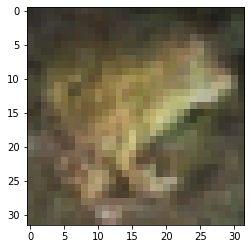

In [371]:
plt.imshow(pred.reshape(32,32,3))

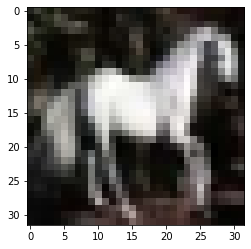

In [375]:
plt.imshow(easy_entropy_data_test[5:6].reshape(32,32,3))

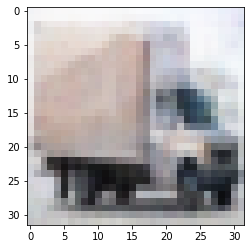

In [269]:
plt.imshow(autoencode_test[1000:1001].reshape(32,32,3))

In [ ]:
#########################
#device = lightweight model
#data = converted_data
#accuracy = "" similarity
#flops, macs, parameters
##########################




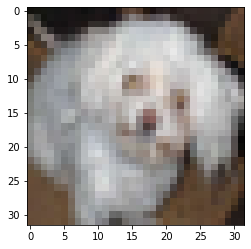

In [170]:
plt.imshow(cifar_x_test[1000].reshape(32,32,3))

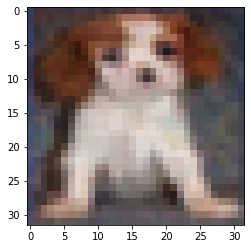

In [171]:
plt.imshow(autoencode_test[1000].reshape(32,32,3))

In [196]:
cifar_y_test[1000]

5

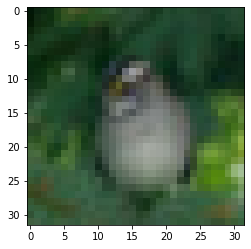

In [290]:
plt.imshow(cifar_x_test[900].reshape(32,32,3))

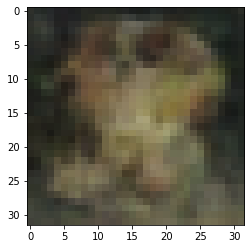

In [291]:
plt.imshow(autoencode_test[900].reshape(32,32,3))

In [297]:
score = model.evaluate(autoencode_test[1000:1001], cifar_y_test[1000:1001], batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1/1 [==============================] - 0s 32ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Test loss: 0.0
Test accuracy: 1.0


In [298]:
score = model.evaluate( cifar_x_test[1000:1001], cifar_y_test[1000:1001], batch_size=32, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1/1 [==============================] - 0s 33ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Test loss: 0.0
Test accuracy: 1.0


In [314]:
softmaxdata=model.predict(cifar_x_test[1000:1001])
entropyvalue = np.array([entropy(s) for s in softmaxdata]) 

In [316]:
print(type(entropyvalue))

<class 'numpy.ndarray'>


In [323]:
def hashmap():
    hashmap={}
    for idx in range(0,len(cifar_x_test)):
        softmaxdata=model.predict(cifar_x_test[idx:idx+1])
        entropyvalue = np.array([entropy(s) for s in softmaxdata])
        h_list=entropy_value.tolist()
        assign = tuple([h_list])
        print(type(idx))
        hashmap[tuple(assign)]=idx
    return hashmap
    

<class 'int'>


TypeError: unhashable type: 'list'

In [303]:
print(h)

NameError: name 'h' is not defined

In [302]:
print(entropyvalue)

[8.555058e-09]


In [191]:
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

In [199]:
cifar_y_test.shape

(10000,)

In [169]:
score = model.evaluate(autoencode_test[455:456], cifar_y_test[455:456], batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1/1 [==============================] - 0s 29ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Test loss: 0.0
Test accuracy: 1.0


In [168]:
score = model.evaluate( cifar_x_test[455:456], cifar_y_test[455:456], batch_size=32, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1/1 [==============================] - 0s 30ms/step - loss: 0.0098 - accuracy: 1.0000
Test loss: 0.00979935098439455
Test accuracy: 1.0


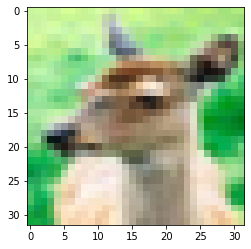

In [116]:
plt.imshow(cifar_x_test[455].reshape(32,32,3))

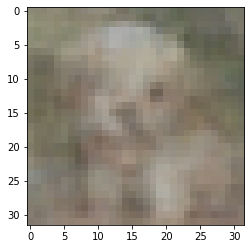

In [117]:
plt.imshow(autoencode_test[455].reshape(32,32,3))

In [206]:
y_test[455]

4

In [60]:
score = model.evaluate(cifar_x_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 0.9482 - accuracy: 0.8300
Test loss: 0.9481577277183533
Test accuracy: 0.8299999833106995


In [32]:
from scipy.stats import entropy

In [208]:
thresholds = [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.25, 0.5, 0.6, 0.75, 1., 5., 10.]

# calculate the entropy date
def calculate_entropy_value(model,X_test,Y_test):
    xdata = X_test.reshape(-1, 32, 32, 3)
    ydata = Y_test
    softmax_data = model.predict(xdata)

    entropy_value = np.array([entropy(s) for s in softmax_data]) 
    print(entropy_value)
    print(len(entropy_value))
    idx = np.zeros(entropy_value.shape[0],dtype=bool)
    
    #complex_model = load_or_train_model("LeNetModel")
    
    numexits = []
    confidences = []
    no_confidences = []
    total = len(softmax_data)
    print(total)
    for threshold in thresholds:
        idx[entropy_value < threshold] = True
        numexit = sum(idx)
        numexits.append(total - numexit)
        
        # keep no confidence data.
        xdata_keep = xdata[0:10000][~idx[0:10000]]
        ydata_keep = ydata[0:10000][~idx[0:10000]]
        print("confidence ", len(xdata_keep), len(ydata_keep))
        if len(xdata_keep) > 0:
            result = model.evaluate(xdata_keep, y = ydata_keep, batch_size=384)
            print("test loss, test acc:", result, (1-result[1])*len(xdata_keep))
            confidences.append((1-result[1])*len(xdata_keep))

            #complex_result = complex_model.evaluate(xdata_keep, y = ydata_keep, batch_size=384)
            #print("complext models result", complex_result, (1-complex_result[1])*len(xdata_keep))
        else:
            confidences.append(0)
            
        
        # keep confidence data.
        xdata_keep = xdata[idx]
        ydata_keep = ydata[idx]
        print("less confidence", len(xdata_keep), len(ydata_keep))
        if len(xdata_keep) > 0:
            result = model.evaluate(xdata_keep, y = ydata_keep, batch_size=384)
            print("test loss, test acc:", result, (1-result[1])*len(xdata_keep))
            print("")
            no_confidences.append((1-result[1])*len(xdata_keep))
        else:
            no_confidences.append(0)

        
    print(numexits)   
    print("no confidence error data")
    print(confidences)
    print("confidence error data")
    print(no_confidences)

In [209]:
calculate_entropy_value(model,cifar_x_train,cifar_y_train)

[1.8766565e-08 1.4436823e-16 4.9356368e-05 ... 7.8694706e-05 5.4678590e-15
 3.3182354e-05]
50000
50000
confidence  2923 2923
8/8 [==============================] - 0s 49ms/step - loss: 0.0219 - accuracy: 0.9932
test loss, test acc: [0.02190667949616909, 0.9931577444076538] 19.999913096427917
less confidence 35324 35324
92/92 [==============================] - 5s 52ms/step - loss: 4.6031e-07 - accuracy: 1.0000
test loss, test acc: [4.6031047418182425e-07, 1.0] 0.0

confidence  1835 1835
5/5 [==============================] - 0s 51ms/step - loss: 0.0349 - accuracy: 0.9891
test loss, test acc: [0.034874748438596725, 0.9891008138656616] 20.000006556510925
less confidence 40654 40654
106/106 [==============================] - 6s 54ms/step - loss: 4.9336e-06 - accuracy: 1.0000
test loss, test acc: [4.933602212986443e-06, 1.0] 0.0

confidence  1135 1135
3/3 [==============================] - 0s 54ms/step - loss: 0.0562 - accuracy: 0.9824
test loss, test acc: [0.05622900277376175, 0.9823788404

In [197]:
final =[]
missed_final=[]
missed_y_label=[]
count = 0
for x in range(0,len(cifar_x_test)):
    score = model.evaluate(cifar_x_test[x:x+1], cifar_y_test[x:x+1], batch_size=batch_size, verbose=1)
    if(score[1]==1):
        final.append(cifar_x_test[x:x+1])
        print("here")
        
    else:
        img = dae.predict(cifar_x_test[x:x+1])
        final.append(img)
        missed_final.append(cifar_x_test[x:x+1])
        missed_y_label.append(cifar_y_test[x:x+1])
    count+=1
    print(count)

1/1 [==============================] - 0s 32ms/step - loss: 0.0167 - accuracy: 1.0000
here
1
1/1 [==============================] - 0s 28ms/step - loss: 0.0014 - accuracy: 1.0000
here
2
1/1 [==============================] - 0s 27ms/step - loss: 3.9802 - accuracy: 0.0000e+00
3
1/1 [==============================] - 0s 27ms/step - loss: 3.6716e-05 - accuracy: 1.0000
here
4
1/1 [==============================] - 0s 23ms/step - loss: 0.0000e+00 - accuracy: 1.0000
here
5
1/1 [==============================] - 0s 26ms/step - loss: 0.0000e+00 - accuracy: 1.0000
here
6
1/1 [==============================] - 0s 26ms/step - loss: 2.8749e-04 - accuracy: 1.0000
here
7
1/1 [==============================] - 0s 26ms/step - loss: 0.0080 - accuracy: 1.0000
here
8
1/1 [==============================] - 0s 26ms/step - loss: 1.6689e-06 - accuracy: 1.0000
here
9
1/1 [==============================] - 0s 26ms/step - loss: 2.3842e-07 - accuracy: 1.0000
here
10
1/1 [==============================] - 0s 26ms

In [199]:
final_test_set = final.reshape(10000,32,32,3)

In [198]:
final = np.array(final)

In [200]:
score = model.evaluate(final_test_set, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 5.0677 - accuracy: 0.8848
Test loss: 5.067723751068115
Test accuracy: 0.8848000168800354


In [201]:
len(missed_final)

1668

In [202]:
missed_final = np.array(missed_final)

In [203]:
final_test_miss_set = missed_final.reshape(len(missed_final),32,32,3)

In [204]:
missed_y_label=np.array(missed_y_label)
missed_y_label=missed_y_label.reshape(len(missed_y_label),1)
missed_y_label=missed_y_label.flatten()

In [205]:
len(missed_y_label)

1668

In [206]:
score = model.evaluate(final_test_miss_set, missed_y_label, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

53/53 [==============================] - 0s 7ms/step - loss: 5.2510 - accuracy: 0.0000e+00
Test loss: 5.251038551330566
Test accuracy: 0.0


In [ ]:
final_test_miss_set[]

In [207]:
final_test_miss_set=np.array(final_test_miss_set)
xdata = final_test_miss_set.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
softmax_data = model.predict(xdata)
entropy_value = np.array([entropy(s) for s in softmax_data]) 

In [208]:
print(entropy_value)

[0.15180804 1.3430836  0.00151271 ... 0.6204328  0.00227358 0.08231729]


In [209]:
len(entropy_value)

1668

In [211]:
for idx in range(0,len(entropy_value)):
    print(entropy_value[idx])

0.15180804
1.3430836
0.0015127095
1.3042732
0.33363506
1.1868904
0.24840018
0.5742432
1.6135359
1.1121626
0.05404411
1.1639305
0.15759613
0.71503973
1.2047068
0.14286305
0.00082993635
0.16351806
0.47070307
0.0003830458
0.008759757
0.67385614
0.87674665
0.30497104
0.32806644
0.54890823
0.025070092
0.6995755
0.057510965
0.76328695
0.002899428
0.007459896
0.00042744348
0.30528182
0.06089725
0.31357467
0.005236367
1.4574914e-06
0.48778993
0.026212571
0.63436407
0.0011691124
0.999916
0.11079503
0.029263312
0.59101796
0.941105
0.51971537
1.246675
0.7630196
0.102487825
0.015892845
0.34591514
1.5229524e-05
1.44006
0.0023949433
0.25295728
0.031148016
0.005784638
0.024875343
0.43049845
0.27576375
0.2636039
0.018063195
0.009926549
0.5348978
1.0957043
1.9075586
0.215922
1.134482
0.19553174
0.62340987
0.0007873401
1.1518373
1.491647
0.77024084
0.3401822
0.020218624
0.00027806728
0.0018277892
0.7216301
0.00082191936
0.6837983
0.07620427
1.640614
0.16060774
1.0793961
1.0894604
1.7400768
0.00022207359

In [475]:
cifar_x_test=np.array(cifar_x_test)
xdata = cifar_x_test.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
softmax_data = model.predict(xdata)
entropy_value = np.array([entropy(s) for s in softmax_data]) 


In [476]:
count =0
test_set=[]
test_ylabel=[]
autoencode_set=[]
autoencode_label=[]
for idx in range(0,len(entropy_value)):
    print(entropy_value[idx])
    if(entropy_value[idx]<0.01):
        count+=1
        test_set.append(cifar_x_test[idx:idx+1])
        test_ylabel.append(cifar_y_test[idx:idx+1])
    else:
        autoencode_set.append(cifar_x_test[idx:idx+1])
        autoencode_label.append(cifar_y_test[idx:idx+1])
        
        
print("Last")        
print(count)

1.3106508e-07
7.9267135e-09
0.23565608
0.052536085
2.7908811e-08
0.0024576604
0.12606926
2.4576668e-05
0.00047030734
3.654125e-07
0.70057887
2.115929e-14
0.9014495
3.9122424e-23
4.6608946e-11
0.12279449
6.214737e-09
7.7252815e-10
1.8217796e-17
7.420904e-23
0.015852911
0.03429935
0.06685555
9.366611e-12
4.444521e-05
1.0656152
0.7179012
1.0260947e-06
8.261072e-06
4.7427244e-12
0.030107103
1.0978601e-08
0.4855947
0.34004763
6.979312e-13
0.8608754
5.3287504e-08
0.21950907
2.4114117e-13
8.295022e-09
1.4353558e-15
1.6860416e-16
0.1854595
3.307103e-15
2.2210117e-14
1.1351313e-12
0.12507781
1.6337179
8.218249e-12
0.022073546
1.2003451e-06
2.9542693e-07
0.8128571
0.014329932
3.4432014e-07
6.8515404e-14
2.007334e-08
0.8366164
0.6682143
0.06227561
3.1248824e-13
0.29150328
3.7280223e-09
1.2180437
0.0004860141
0.42421436
1.9845855e-05
3.8281098e-05
0.73627174
0.12760359
0.003412263
2.0122823e-05
5.959442e-17
7.420654e-11
0.0024600455
1.7699539e-12
0.2903424
0.0037199177
0.14684124
5.034328e-17
3.64

In [477]:
test_set= np.array(test_set)
test_set= test_set.reshape(-1,32,32,3)

In [478]:
test_ylabel= np.array(test_ylabel)
test_ylabel.flatten()

array([3, 8, 6, ..., 5, 1, 7])

In [479]:
score = model.evaluate(test_set, test_ylabel, batch_size=batch_size, verbose=1)

210/210 [==============================] - 2s 8ms/step - loss: 0.4672 - accuracy: 0.9638


In [480]:
score = model.evaluate(test_set, test_ylabel, batch_size=batch_size, verbose=1)

210/210 [==============================] - 2s 8ms/step - loss: 0.4672 - accuracy: 0.9638


In [481]:
len(autoencode_set)

3310

In [482]:
autoencode_set= np.array(autoencode_set)
autoencode_set= autoencode_set.reshape(-1,32,32,3)

In [483]:
autoencode_label= np.array(autoencode_label)
autoencode_label.flatten()

array([8, 0, 1, ..., 5, 2, 8])

In [484]:
len(autoencode_label)

3310

In [485]:
len(autoencode_set)


3310

In [144]:
autoencode_set.shape

NameError: name 'autoencode_set' is not defined

In [487]:
decoded_rest = dae.predict(autoencode_set.reshape(autoencode_set.shape[0],32,32,3))

In [488]:
decoded_rest.shape

(3310, 32, 32, 3)

In [491]:
score = model.evaluate(decoded_rest, autoencode_label, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

104/104 [==============================] - 1s 8ms/step - loss: 16.3020 - accuracy: 0.5831
Test loss: 16.301977157592773
Test accuracy: 0.5830815434455872


In [493]:
final_x_set=[]

In [494]:
final_x_set.append(test_set)
final_x_set.append(decoded_rest)

In [495]:
len(final_x_set)

2

In [270]:
len(test_set)

5743

In [271]:
len(decoded_rest)

4257

In [496]:
final_x_set= np.array(final_x_set)

/tmp/ipykernel_3728274/1516939864.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  final_x_set= np.array(final_x_set)


In [497]:
final_ll= test_set.tolist() + decoded_rest.tolist()

In [498]:
type(decoded_rest)

numpy.ndarray

In [499]:
len(final_ll)

10000

In [500]:
final_ll= np.array(final_ll)

In [501]:
final_ll= final_ll.reshape(-1,32,32,3)

In [502]:
test_set= np.array(test_set)

In [329]:
test_set.shape

(6606, 32, 32, 3)

In [330]:
decoded_rest.shape

(3394, 32, 32, 3)

In [331]:
len(autoencode_label)

3394

In [332]:
len(test_ylabel)

6606

In [307]:
type(autoencode_label)

numpy.ndarray

In [334]:
type(test_ylabel)

numpy.ndarray

In [503]:
final_y_label = test_ylabel.tolist()+autoencode_label.tolist()

In [504]:
len(final_y_label)

10000

In [505]:
final_y_label = np.array(final_y_label)
final_y_label= final_y_label.flatten()

In [507]:
score = model.evaluate(final_ll, final_y_label, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 5.7085 - accuracy: 0.8378
Test loss: 5.7085442543029785
Test accuracy: 0.8378000259399414


In [623]:
cifar_x_test=np.array(cifar_x_test)
xdata = cifar_x_test.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
softmax_data = model.predict(xdata)
entropy_value = np.array([entropy(s) for s in softmax_data])
def calculate_thresholded_entropy(thresholds):
    count =0
    test_set=[]
    test_ylabel=[]
    autoencode_set=[]
    autoencode_label=[]
    for idx in range(0,len(entropy_value)):
        #print(entropy_value[idx])
        if(entropy_value[idx]<thresholds):
            count+=1
            test_set.append(cifar_x_test[idx:idx+1])
            test_ylabel.append(cifar_y_test[idx:idx+1])
        else:
            autoencode_set.append(cifar_x_test[idx:idx+1])
            autoencode_label.append(cifar_y_test[idx:idx+1])
        
        
    print("Last")        
    print("Easy Data : ",count)
    print("Hard Data : ",10000-count)
    
    return test_set,test_ylabel,autoencode_set, autoencode_label
    

In [633]:
def merge_autoencode(thresholds):
    test_set,test_ylabel,autoencode_set,autoencode_label=calculate_thresholded_entropy(thresholds)
    #print(autoencode_set.shape)
    if(test_set and autoencode_set ):
        test_set= np.array(test_set)
        test_set= test_set.reshape(-1,32,32,3)
        test_ylabel= np.array(test_ylabel)
        test_ylabel.flatten()
        autoencode_set=np.array(autoencode_set)
        decoded_rest = dae.predict(autoencode_set.reshape(-1,32,32,3))
        final_ll= test_set.tolist() + decoded_rest.tolist()
        final_y_label = test_ylabel.tolist()+autoencode_label
        final_ll= np.array(final_ll)
        final_ll= final_ll.reshape(-1,32,32,3)
        final_y_label = np.array(final_y_label)
        final_y_label= final_y_label.flatten()
    elif(test_set and not autoencode_set):
        test_set= np.array(test_set)
        test_set= test_set.reshape(-1,32,32,3)
        test_ylabel= np.array(test_ylabel)
        test_ylabel.flatten()
        final_ll= test_set.tolist()
        final_y_label = test_ylabel.tolist()
        final_ll= np.array(final_ll)
        final_ll= final_ll.reshape(-1,32,32,3)
        final_y_label = np.array(final_y_label)
        final_y_label= final_y_label.flatten()
    elif(autoencode_set and not test_set):
        autoencode_set=np.array(autoencode_set)
        decoded_rest = dae.predict(autoencode_set.reshape(-1,32,32,3))
        final_ll= autoencode_set.tolist()
        final_y_label = autoencode_label
        final_ll= np.array(final_ll)
        final_ll= final_ll.reshape(-1,32,32,3)
        final_y_label = np.array(final_y_label)
        final_y_label= final_y_label.flatten()
    
        
    return final_ll,final_y_label,test_set,test_ylabel
    
    
    

In [605]:
best_accuarcy = 0.0
best_thresholds=0

In [636]:
def thresholded_accuracy():
    
    thresholds_array = np.linspace(0.001, 1, num=100)
    best_accuarcy = 0.0
    best_thresholds = 0
    for thresholds in (thresholds_array):
        final_ll,final_y_label,test_set,test_ylabel = merge_autoencode(thresholds)
    
        score = model.evaluate(final_ll, final_y_label, batch_size=batch_size, verbose=1)
        print("For threshold :",thresholds)
        print('Test loss:', score[0])
        print('Test accuracy:', score[1])
        if(score[1]>best_accuarcy):
            best_accuarcy=score[1]
            best_thresholds=thresholds
        
        print()
    
    return best_accuarcy,best_thresholds
    
    

In [637]:
best_acc,best_th=thresholded_accuracy()

Last
Easy Data :  5872
Hard Data :  4128
313/313 [==============================] - 2s 7ms/step - loss: 6.4156 - accuracy: 0.8264
For threshold : 0.001
Test loss: 6.415553092956543
Test accuracy: 0.8263999819755554

Last
Easy Data :  6733
Hard Data :  3267
313/313 [==============================] - 2s 7ms/step - loss: 5.6699 - accuracy: 0.8378
For threshold : 0.011090909090909092
Test loss: 5.6699419021606445
Test accuracy: 0.8378000259399414

Last
Easy Data :  6990
Hard Data :  3010
313/313 [==============================] - 2s 7ms/step - loss: 5.3756 - accuracy: 0.8412
For threshold : 0.021181818181818184
Test loss: 5.375638484954834
Test accuracy: 0.8411999940872192

Last
Easy Data :  7160
Hard Data :  2840
313/313 [==============================] - 2s 7ms/step - loss: 5.1806 - accuracy: 0.8424
For threshold : 0.03127272727272727
Test loss: 5.180598258972168
Test accuracy: 0.8424000144004822

Last
Easy Data :  7284
Hard Data :  2716
313/313 [==============================] - 2s 7ms/

In [ ]:
original =82%
original+ model : 84.82%
    
we have lightweight model, 

In [638]:
best_acc,best_th

(0.8482000231742859, 0.09181818181818183)

In [597]:


final_ll,final_y_label,test_set,test_ylabel=merge_autoencode(.01)

1.3106508e-07
7.9267135e-09
0.23565608
0.052536085
2.7908811e-08
0.0024576604
0.12606926
2.4576668e-05
0.00047030734
3.654125e-07
0.70057887
2.115929e-14
0.9014495
3.9122424e-23
4.6608946e-11
0.12279449
6.214737e-09
7.7252815e-10
1.8217796e-17
7.420904e-23
0.015852911
0.03429935
0.06685555
9.366611e-12
4.444521e-05
1.0656152
0.7179012
1.0260947e-06
8.261072e-06
4.7427244e-12
0.030107103
1.0978601e-08
0.4855947
0.34004763
6.979312e-13
0.8608754
5.3287504e-08
0.21950907
2.4114117e-13
8.295022e-09
1.4353558e-15
1.6860416e-16
0.1854595
3.307103e-15
2.2210117e-14
1.1351313e-12
0.12507781
1.6337179
8.218249e-12
0.022073546
1.2003451e-06
2.9542693e-07
0.8128571
0.014329932
3.4432014e-07
6.8515404e-14
2.007334e-08
0.8366164
0.6682143
0.06227561
3.1248824e-13
0.29150328
3.7280223e-09
1.2180437
0.0004860141
0.42421436
1.9845855e-05
3.8281098e-05
0.73627174
0.12760359
0.003412263
2.0122823e-05
5.959442e-17
7.420654e-11
0.0024600455
1.7699539e-12
0.2903424
0.0037199177
0.14684124
5.034328e-17
3.64

In [598]:
score = model.evaluate(test_set, test_ylabel, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

210/210 [==============================] - 2s 8ms/step - loss: 0.4672 - accuracy: 0.9638
Test loss: 0.4672468304634094
Test accuracy: 0.963826596736908


In [599]:
score = model.evaluate(final_ll, final_y_label, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 5.7085 - accuracy: 0.8378
Test loss: 5.7085442543029785
Test accuracy: 0.8378000259399414


In [400]:
softmax_data_temp = model.predict(final_ll[1000:1001])
entropy_value_temp = np.array([entropy(s) for s in softmax_data_temp])

In [402]:
print(entropy_value_temp)

[3.302025e-10]


In [113]:
final_entropy =[]
count = 0
for x in range(0,len(cifar_x_test)):
    #score = model.evaluate(cifar_x_test[x:x+1], cifar_y_test[x:x+1], batch_size=batch_size, verbose=1)
    softmax_data_temp = model.predict(cifar_x_test[x:x+1])
    entropy_value_temp = np.array([entropy(s) for s in softmax_data_temp])
    decoded_auto_entropy = dae.predict(cifar_x_test[x:x+1])
    softmax_data_temp_decoded = model.predict(decoded_auto_entropy)
    entropy_value_temp_decoded = np.array([entropy(s) for s in softmax_data_temp_decoded])
    if(entropy_value_temp>entropy_value_temp_decoded):
        final_entropy.append(decoded_auto_entropy)
        print("here")
        
    else:
        final_entropy.append(cifar_x_test[x:x+1])
    count+=1
    print(count)

here
1
here
2
here
3
here
4
here
5
here
6
here
7
here
8
here
9
here
10
here
11
here
12
here
13
here
14
here
15
here
16
here
17
here
18
here
19
here
20
21
here
22
here
23
here
24
here
25
here
26
here
27
28
here
29
here
30
here
31
here
32
here
33
here
34
here
35
here
36
here
37
here
38
here
39
here
40
here
41
here
42
here
43
here
44
here
45
here
46
here
47
here
48
49
here
50
here
51
here
52
here
53
here
54
here
55
here
56
here
57
here
58
here
59
here
60
here
61
here
62
here
63
here
64
here
65
here
66
here
67
here
68
here
69
here
70
here
71
here
72
here
73
here
74
here
75
here
76
here
77
here
78
79
here
80
here
81
here
82
here
83
here
84
here
85
here
86
87
here
88
here
89
here
90
here
91
here
92
here
93
here
94
here
95
96
here
97
98
here
99
here
100
here
101
here
102
here
103
here
104
here
105
here
106
107
here
108
here
109
here
110
here
111
here
112
here
113
here
114
here
115
here
116
here
117
118
here
119
here
120
here
121
here
122
here
123
here
124
here
125
here
126
here
127
here
128
h

In [114]:
final_entropy=np.array(final_entropy)

In [116]:
print(len(final_entropy))
final_entropy= final_entropy.reshape(-1,32,32,3)

10000


In [117]:
final_entropy.shape

(10000, 32, 32, 3)

In [118]:
score = model.evaluate(final_entropy, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 10.2061 - accuracy: 0.7797
Test loss: 10.206076622009277
Test accuracy: 0.779699981212616


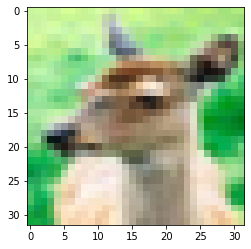

In [119]:
plt.imshow(final_entropy[455:456].reshape(32,32,3))

In [120]:
score = model.evaluate(final_entropy[455:456], cifar_y_test[455:456], batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1/1 [==============================] - 0s 32ms/step - loss: 1.1921e-07 - accuracy: 1.0000
Test loss: 1.1920928244535389e-07
Test accuracy: 1.0


In [586]:
def plane_Bucket_cluster(img1,img2):
        test_image1 = img1.reshape(32,32,3)
        test_image1 = test_image1.flatten()
        test_image1 = test_image1/255
        test_image2 = img2.reshape(32,32,3)
        test_image2 = test_image2.flatten()
        test_image2 = test_image2/255
        similarity = -1 * (spatial.distance.cosine(test_image1, test_image2) - 1)
        #x= x+1
        return similarity

In [124]:
plane_Bucket_cluster(cifar_x_test[1205:1206],final_entropy[1203:1204])

0.9316256154081074

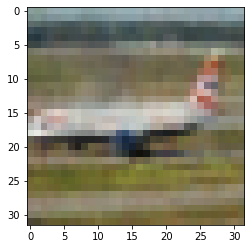

In [123]:
plt.imshow(final_entropy[1203:1204].reshape(32,32,3))

In [ ]:
plt.imshow(cifar_x_test[1205:1206].reshape(32,32,3))

In [588]:
from scipy import spatial

In [589]:
final_entropy_cosine =[]
count = 0
count_entropy=0
for x in range(0,len(cifar_x_test)):
    #score = model.evaluate(cifar_x_test[x:x+1], cifar_y_test[x:x+1], batch_size=batch_size, verbose=1)
    softmax_data_temp = model.predict(cifar_x_test[x:x+1])
    entropy_value_temp = np.array([entropy(s) for s in softmax_data_temp])
    decoded_auto_entropy = dae.predict(cifar_x_test[x:x+1])
    softmax_data_temp_decoded = model.predict(decoded_auto_entropy)
    entropy_value_temp_decoded = np.array([entropy(s) for s in softmax_data_temp_decoded])
    similarity= plane_Bucket_cluster(cifar_x_test[x:x+1],decoded_auto_entropy)
    print(similarity)
    if(entropy_value_temp>entropy_value_temp_decoded and similarity>0.94):
        final_entropy_cosine.append(decoded_auto_entropy)
        print("here")
        count_entropy+=1
        
    else:
        final_entropy_cosine.append(cifar_x_test[x:x+1])
    count+=1
    print(count)

0.8835176356720398
1
0.9613091637061177
here
2
0.9420213353542316
here
3
0.9558598527877892
here
4
0.8542269541841271
5
0.854982657597604
6
0.6623224112217206
7
0.8197341912354734
8
0.8644291172614437
9
0.9206756467766729
10
0.9185400878950236
11
0.8783243655549334
12
0.8082046476002908
13
0.724706161361628
14
0.8235505896308228
15
0.8831212849473274
16
0.7978589684162337
17
0.8912335704364817
18
0.9184320543965254
19
0.8779558271391406
20
0.8684922546916398
21
0.7702385689107644
22
0.907922506966415
23
0.8205688416833705
24
0.8914418615043818
25
0.9019672704620529
26
0.8195160568052469
27
0.8315973749970992
28
0.8521409322138732
29
0.821706120974289
30
0.7491054974974053
31
0.8114600676795757
32
0.9155590854620118
33
0.709289001227836
34
0.9572216188340753
here
35
0.6970079542811155
36
0.9139313465395396
37
0.9029026912531036
38
0.9084201850771094
39
0.8158880536314306
40
0.915576767073476
41
0.7733410095070039
42
0.6636976498553766
43
0.8415764013549586
44
0.9072955303811769
45
0.881

In [590]:
print(count_entropy)

811


In [591]:
final_entropy_cosine=np.array(final_entropy_cosine)

In [592]:
print(len(final_entropy_cosine))
final_entropy_cosine= final_entropy_cosine.reshape(-1,32,32,3)

10000


In [593]:
final_entropy_cosine.shape

(10000, 32, 32, 3)

In [594]:
score = model.evaluate(final_entropy_cosine, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 1.3720 - accuracy: 0.8268
Test loss: 1.3720306158065796
Test accuracy: 0.8267999887466431


In [583]:
score = model.evaluate(cifar_x_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 2s 7ms/step - loss: 0.9482 - accuracy: 0.8300
Test loss: 0.9481577277183533
Test accuracy: 0.8299999833106995


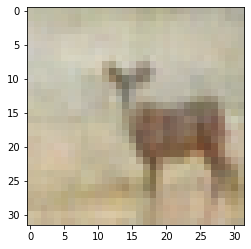

In [429]:
plt.imshow(final_entropy[455:456].reshape(32,32,3))

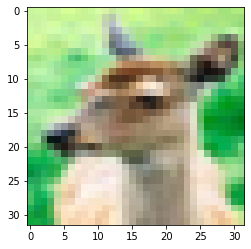

In [430]:
plt.imshow(cifar_x_test[455:456].reshape(32,32,3))

In [471]:
len(train_exits)
train_easy=[]
train_hard=[]

In [475]:
train_easy=[]
train_hard=[]
train_easy_label=[]
train_hard_label=[]
for idx in range(0,len(train_exits)):
    if(train_exits[idx]==0):
        train_easy.append(cifar_x_train[idx])
        train_easy_label.append(cifar_y_train[idx])
    else:
        train_hard.append(cifar_x_train[idx])
        train_hard_label.append(cifar_y_train[idx])
        


In [483]:
train_easy= np.array(train_easy)
train_easy= train_easy.reshape(-1,32,32,3)
train_hard= np.array(train_hard)
train_hard= train_hard.reshape(-1,32,32,3)

In [484]:
train_easy_label=np.array(train_easy_label)
train_easy_label=train_easy_label.flatten()
train_hard_label=np.array(train_hard_label)
train_hard_label=train_hard_label.flatten()


In [485]:
score = model.evaluate(train_easy, train_easy_label, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

738/738 [==============================] - 5s 7ms/step - loss: 0.0041 - accuracy: 0.9983
Test loss: 0.004090433474630117
Test accuracy: 0.9983479380607605


In [487]:
score = model.evaluate(train_hard, train_hard_label, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

825/825 [==============================] - 6s 7ms/step - loss: 0.0120 - accuracy: 0.9965
Test loss: 0.012034391053020954
Test accuracy: 0.9965142011642456


In [479]:
len(train_easy)

23607

In [480]:
len(train_easy_label)

23607

In [481]:
print(train_easy_label)

[9 4 1 ... 0 1 1]


In [488]:
train_easy.shape

(23607, 32, 32, 3)

In [17]:
from keras.models import Sequential
import numpy as np
import os
from keras.datasets import cifar10, cifar100
from keras.models import Sequential
from keras.layers import Dense, Conv2D
from keras.layers import Dropout
from keras.layers import Flatten, Activation
from keras.constraints import maxnorm
from tensorflow.keras.optimizers import SGD, Adam
from keras.layers.convolutional import Convolution2D
from keras.layers.convolutional import MaxPooling2D
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras import backend as K

from keras.utils import np_utils
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
%matplotlib inline

import skimage
from skimage.util import img_as_ubyte
from scipy.stats import entropy

In [572]:
def AlexnetModel(input_shape,num_classes):
    model = Sequential()
    model.add(Convolution2D(64, (4, 4), padding='same', input_shape=input_shape, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))
    #model.add(Activation('relu'))
    model.add(Dropout(0.25))
    
    model.add(Convolution2D(64, (2, 2), padding='same', activation='relu'))
    #model.add(Activation('relu'))
    model.add(Dropout(0.25))
    
    
    model.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
    #model.add(Activation('relu'))
    model.add(Dropout(0.25))
    
    model.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
    #model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))
    model.add(Dropout(0.15))
    model.add(Flatten())
    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64))
    model.add(Activation('tanh'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))
    
    return model

In [560]:
input_shape=(32,32,3)
num_classes =10

In [561]:
def AlexnetModel_01(input_shape,num_classes):
    model = Sequential()
    model.add(Convolution2D(64, (4, 4), padding='same', input_shape=input_shape, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))
    #model.add(Activation('relu'))
    model.add(Dropout(0.25))
    
    
    model.add(Convolution2D(32, (3, 3), padding='same', activation='relu'))
    #model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))
    model.add(Dropout(0.15))
    model.add(Flatten())
    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64))
    model.add(Activation('tanh'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))
    
    return model

In [562]:
lightweight_model = AlexnetModel_01(input_shape,num_classes)

In [564]:
lightweight_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [571]:
lightweight_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_100 (Conv2D)         (None, 32, 32, 64)        3136      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 16, 64)       0         
 )                                                               
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 conv2d_101 (Conv2D)         (None, 16, 16, 32)        18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 8, 8, 32)         0         
 2D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 8, 8, 32)         

In [565]:
rs = lightweight_model.fit(
  cifar_x_train, cifar_y_train, validation_data=(cifar_x_test, cifar_y_test), epochs=50)

Epoch 1/50
1563/1563 [==============================] - 15s 9ms/step - loss: 1.6346 - accuracy: 0.3959 - val_loss: 1.3469 - val_accuracy: 0.5204
Epoch 2/50
1563/1563 [==============================] - 14s 9ms/step - loss: 1.3385 - accuracy: 0.5232 - val_loss: 1.1800 - val_accuracy: 0.5757
Epoch 3/50
1563/1563 [==============================] - 15s 9ms/step - loss: 1.2209 - accuracy: 0.5630 - val_loss: 1.0747 - val_accuracy: 0.6197
Epoch 4/50
1563/1563 [==============================] - 15s 9ms/step - loss: 1.1473 - accuracy: 0.5943 - val_loss: 1.0293 - val_accuracy: 0.6411
Epoch 5/50
1563/1563 [==============================] - 14s 9ms/step - loss: 1.1033 - accuracy: 0.6112 - val_loss: 0.9941 - val_accuracy: 0.6505
Epoch 6/50
1563/1563 [==============================] - 15s 9ms/step - loss: 1.0718 - accuracy: 0.6243 - val_loss: 1.0194 - val_accuracy: 0.6434
Epoch 7/50
1563/1563 [==============================] - 15s 9ms/step - loss: 1.0319 - accuracy: 0.6364 - val_loss: 0.9310 - val_ac

In [573]:
alex_net_model = AlexnetModel(input_shape,num_classes)

In [578]:
alex_net_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_102 (Conv2D)         (None, 32, 32, 64)        3136      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 64)       0         
 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 conv2d_103 (Conv2D)         (None, 16, 16, 64)        16448     
                                                                 
 dropout_6 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 conv2d_104 (Conv2D)         (None, 16, 16, 32)        18464     
                                                      

In [574]:
alex_net_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [575]:
alex = alex_net_model.fit(
  cifar_x_train, cifar_y_train, validation_data=(cifar_x_test, cifar_y_test), epochs=50)

Epoch 1/50
1563/1563 [==============================] - 22s 14ms/step - loss: 1.7422 - accuracy: 0.3584 - val_loss: 1.4513 - val_accuracy: 0.4791
Epoch 2/50
1563/1563 [==============================] - 21s 14ms/step - loss: 1.4402 - accuracy: 0.4770 - val_loss: 1.2964 - val_accuracy: 0.5312
Epoch 3/50
1563/1563 [==============================] - 21s 14ms/step - loss: 1.3116 - accuracy: 0.5295 - val_loss: 1.1568 - val_accuracy: 0.5891
Epoch 4/50
1563/1563 [==============================] - 21s 14ms/step - loss: 1.2364 - accuracy: 0.5587 - val_loss: 1.1015 - val_accuracy: 0.6034
Epoch 5/50
1563/1563 [==============================] - 21s 14ms/step - loss: 1.1838 - accuracy: 0.5797 - val_loss: 1.0891 - val_accuracy: 0.6138
Epoch 6/50
1563/1563 [==============================] - 21s 14ms/step - loss: 1.1382 - accuracy: 0.5963 - val_loss: 0.9952 - val_accuracy: 0.6511
Epoch 7/50
1563/1563 [==============================] - 21s 13ms/step - loss: 1.1048 - accuracy: 0.6108 - val_loss: 0.9996 -

In [576]:
score = alex_net_model.evaluate(cifar_x_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 1s 3ms/step - loss: 0.8054 - accuracy: 0.7360
Test loss: 0.8053554892539978
Test accuracy: 0.7360000014305115


In [577]:
score = alex_net_model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 1s 3ms/step - loss: 0.9241 - accuracy: 0.7845
Test loss: 0.9241262674331665
Test accuracy: 0.784500002861023


In [568]:
score = lightweight_model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 1s 3ms/step - loss: 1.0149 - accuracy: 0.7854
Test loss: 1.0148966312408447
Test accuracy: 0.7853999733924866


In [570]:
score = lightweight_model.evaluate(cifar_x_test, cifar_y_test, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

313/313 [==============================] - 1s 3ms/step - loss: 0.8612 - accuracy: 0.7219
Test loss: 0.861221194267273
Test accuracy: 0.7218999862670898


In [446]:
import keras
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers.advanced_activations import LeakyReLU
import tensorflow as tf
from tensorflow import keras
import keras.layers as layers
alexnet_model1 = keras.Sequential()
alexnet_model1.add(layers.Conv2D(filters=96, kernel_size=(11, 11), 
                        strides=(4, 4), activation="relu", 
                        input_shape=(32, 32, 3)))
alexnet_model1.add(layers.BatchNormalization())
alexnet_model1.add(layers.MaxPool2D(pool_size=(3, 3), strides= (2, 2)))
alexnet_model1.add(layers.Conv2D(filters=256, kernel_size=(5, 5), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
alexnet_model1.add(layers.BatchNormalization())
alexnet_model1.add(layers.MaxPool2D(pool_size=(3, 3), strides=(2, 2)))
alexnet_model1.add(layers.Conv2D(filters=384, kernel_size=(3, 3), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
alexnet_model1.add(layers.BatchNormalization())
alexnet_model1.add(layers.Conv2D(filters=384, kernel_size=(3, 3), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
alexnet_model1.add(layers.BatchNormalization())
alexnet_model1.add(layers.Conv2D(filters=256, kernel_size=(3, 3), 
                        strides=(1, 1), activation="relu", 
                        padding="same"))
alexnet_model1.add(layers.BatchNormalization())
alexnet_model1.add(layers.MaxPool2D(pool_size=(3, 3), strides=(2, 2)))
alexnet_model1.add(layers.Flatten())
alexnet_model1.add(layers.Dense(4096, activation="relu"))
alexnet_model1.add(layers.Dropout(0.5))
alexnet_model1.add(layers.Dense(10, activation="softmax"))
alexnet_model1.compile(loss='sparse_categorical_crossentropy', 
              optimizer=tf.optimizers.SGD(lr=0.001), 
              metrics=['accuracy'])
alexnet_model1.summary()

ValueError: Exception encountered when calling layer "max_pooling2d_66" (type MaxPooling2D).

Negative dimension size caused by subtracting 3 from 2 for '{{node max_pooling2d_66/MaxPool}} = MaxPool[T=DT_FLOAT, data_format="NHWC", explicit_paddings=[], ksize=[1, 3, 3, 1], padding="VALID", strides=[1, 2, 2, 1]](Placeholder)' with input shapes: [?,2,2,256].

Call arguments received:
  • inputs=tf.Tensor(shape=(None, 2, 2, 256), dtype=float32)

In [432]:
def vgg_net():
    model = K.Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(32, 32, 3)))
    model.add(BatchNormalization())
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(K.layers.Dropout(0.2))
    model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(K.layers.Dropout(0.3))
    model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(K.layers.Dropout(0.4))
    model.add(K.layers.Flatten())
    model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(K.layers.Dropout(0.5))
    model.add(Dense(10, activation='softmax'))
    # compile model
    model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
    
    return model 

In [433]:
vgg_net= vgg_net()

In [434]:
vgg_net.build((32,32,3)) 

In [431]:
vgg_net.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [435]:
vgg_net.summary()

Model: "sequential_74"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_235 (Conv2D)         (None, 32, 32, 32)        896       
                                                                 
 batch_normalization_263 (Ba  (None, 32, 32, 32)       128       
 tchNormalization)                                               
                                                                 
 conv2d_236 (Conv2D)         (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_264 (Ba  (None, 32, 32, 32)       128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_56 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                     

In [33]:

import tensorflow.keras as K

In [34]:
model = K.Sequential()

In [122]:
check = K.Sequential()
check.add(Conv2D(10, (5,5), input_shape=(64, 6, 6)))
check.add(Conv2D(10,(1,1)))
check.add(K.layers.UpSampling2D())
check.add(Conv2D(10,(2,2)))

In [123]:
check.summary()

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 60, 2, 10)         1510      
                                                                 
 conv2d_17 (Conv2D)          (None, 60, 2, 10)         110       
                                                                 
 up_sampling2d_13 (UpSamplin  (None, 120, 4, 10)       0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 119, 3, 10)        410       
                                                                 
Total params: 2,030
Trainable params: 2,030
Non-trainable params: 0
_________________________________________________________________


In [415]:
max_probability_second =[]
for idx in range(0,len(cifar_x_test)):
    max_probability_second.append(np.max(model_second.predict(cifar_x_test[idx:idx+1])))
    

In [416]:
max_probability_first =[]
for idx in range(0,len(cifar_x_test)):
    max_probability_first.append(np.max(model_first.predict(cifar_x_test[idx:idx+1])))

In [514]:
type(max_probability_first)

list

In [417]:
dat = numpy.array([max_probability_first, max_probability_second])

dat = dat.T

numpy.savetxt('data.txt', dat, delimiter = '  ,   ')

In [424]:
max_probability_second[6:7]

[0.99995375]

In [425]:
type(entropy_value_first[idx])

numpy.float32

In [ ]:
>=entropy_value_second[idx]

In [426]:
entropy_value_first_list= entropy_value_first.tolist()

In [427]:
entropy_value_second_list= entropy_value_second.tolist()

In [428]:
dat = numpy.array([max_probability_first, max_probability_second,entropy_value_first_list,entropy_value_second_list])

dat = dat.T

numpy.savetxt('data.txt', dat, delimiter = '  ,   ')

In [443]:
similar_animals=[2,3,4,5,6,7]
similar_machines=[0,1,8,9]
animal_x_train=[]
animals_y_train=[]
machine_x_train=[]
machine_y_train=[]

for idx in range(0,len(cifar_x_train)):
    if(cifar_y_train[idx] in similar_animals):
        animal_x_train.append(cifar_x_train[idx:idx+1])
        animals_y_train.append(0)
        
    else:
        machine_x_train.append(cifar_x_train[idx:idx+1])
        machine_y_train.append(0)
        
        
        
        


In [451]:
similar_animals=[2,3,4,5,6,7]
similar_machines=[0,1,8,9]
animal_x_train=[]
animals_y_train=[]
machine_x_train=[]
machine_y_train=[]
y_train_heirchial=[]

for idx in range(0,len(cifar_x_train)):
    if(cifar_y_train[idx] in similar_animals):
        #animal_x_train.append(cifar_x_train[idx:idx+1])
        y_train_heirchial.append(0)
        
    else:
        #machine_x_train.append(cifar_x_train[idx:idx+1])
        y_train_heirchial.append(1)

In [453]:
similar_animals=[2,3,4,5,6,7]
similar_machines=[0,1,8,9]
animal_x_train=[]
animals_y_train=[]
machine_x_train=[]
machine_y_train=[]
y_test_heirchial=[]

for idx in range(0,len(cifar_x_test)):
    if(cifar_y_test[idx] in similar_animals):
        #animal_x_train.append(cifar_x_train[idx:idx+1])
        y_test_heirchial.append(0)
        
    else:
        #machine_x_train.append(cifar_x_train[idx:idx+1])
        y_test_heirchial.append(1)

In [454]:
len(y_test_heirchial)

10000

In [ ]:
def conv_block(x, filters, kernel_size, strides=2):
   x = Conv2D(filters=filters,
              kernel_size=kernel_size,
              strides=strides,
              padding='same')(x)
   x = BatchNormalization()(x)
   x = ReLU()(x)
   return x
def deconv_block(x, filters, kernel_size):
   x = Conv2DTranspose(filters=filters,
                       kernel_size=kernel_size,
                       strides=2,
                       padding='same')(x)
   x = BatchNormalization()(x)
   x = ReLU()(x)
   return x


def denoising_autoencoder():
   dae_inputs = Input(shape=(32, 32, 3), name='dae_input')
   conv_block1 = conv_block(dae_inputs, 32, 3)
   conv_block2 = conv_block(conv_block1, 64, 3)
   conv_block3 = conv_block(conv_block2, 128, 3)
   conv_block4 = conv_block(conv_block3, 256, 3)
   conv_block5 = conv_block(conv_block4, 256, 3, 1)

   deconv_block1 = deconv_block(conv_block5, 256, 3)
   merge1 = Concatenate()([deconv_block1, conv_block3])
   deconv_block2 = deconv_block(merge1, 128, 3)
   merge2 = Concatenate()([deconv_block2, conv_block2])
   deconv_block3 = deconv_block(merge2, 64, 3)
   merge3 = Concatenate()([deconv_block3, conv_block1])
   deconv_block4 = deconv_block(merge3, 32, 3)

   final_deconv = Conv2DTranspose(filters=3,
                       kernel_size=3,
                       padding='same')(deconv_block4)
   ##change
   #final_deconv1= Dropout(0.25)(final_deconv)

   dae_outputs = Activation('sigmoid', name='dae_output')(final_deconv)
  
   return Model(dae_inputs, dae_outputs, name='dae')

In [481]:
dae.summary()

Model: "dae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 dae_input (InputLayer)         [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_27 (Conv2D)             (None, 16, 16, 32)   896         ['dae_input[0][0]']              
                                                                                                  
 batch_normalization_49 (BatchN  (None, 16, 16, 32)  128         ['conv2d_27[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 re_lu_49 (ReLU)                (None, 16, 16, 32)   0           ['batch_normalization_49[0][0]'

In [452]:
len(y_train_heirchial)

50000

In [11]:




######New classifier
similar_first =[0,1,2,3,7]
similar_2nd= [4,5,6,8,9]
similar_animals=[2,3,4,5,6,7]
similar_machines=[0,1,8,9]
animal_x_train=[]
animals_y_train=[]
machine_x_train=[]
machine_y_train=[]
y_test_heirchial_group=[]

for idx in range(0,len(cifar_x_test)):
    if(cifar_y_test[idx] in similar_first):
        #animal_x_train.append(cifar_x_train[idx:idx+1])
        y_test_heirchial_group.append(0)
        
    else:
        #machine_x_train.append(cifar_x_train[idx:idx+1])
        y_test_heirchial_group.append(1)

In [12]:
similar_first =[0,1,2,3,7]
similar_2nd= [4,5,6,8,9]
similar_animals=[2,3,4,5,6,7]
similar_machines=[0,1,8,9]
animal_x_train=[]
animals_y_train=[]
machine_x_train=[]
machine_y_train=[]
y_train_heirchial_group=[]

for idx in range(0,len(cifar_x_train)):
    if(cifar_y_train[idx] in similar_first):
        #animal_x_train.append(cifar_x_train[idx:idx+1])
        y_train_heirchial_group.append(0)
        
    else:
        #machine_x_train.append(cifar_x_train[idx:idx+1])
        y_train_heirchial_group.append(1)

In [13]:
y_test_heirchial_group=np.array(y_test_heirchial_group)
y_test_heirchial_group=y_test_heirchial_group.reshape(10000,)
y_train_heirchial_group=np.array(y_train_heirchial_group)
y_train_heirchial_group=y_train_heirchial_group.reshape(50000,)

In [14]:
import tensorflow.keras as K

In [15]:
Y_train=  K.utils.to_categorical(y_train_heirchial_group, 2)
Y_test=  K.utils.to_categorical(y_test_heirchial_group, 2)

In [624]:
y_test_heirchial_group.shape

(10000,)

In [627]:
y_train_heirchial_group.shape

(50000,)

In [579]:
Y_test.shape

(10000, 10)

In [ ]:
Classify_model.fit(cifar_x_train, Y_train,
batch_size=128,
validation_data=(cifar_x_test, Y_test),
epochs=30,
verbose=1
)

Epoch 1/30
391/391 [==============================] - 37s 94ms/step - loss: 0.0377 - accuracy: 0.9866 - val_loss: 0.4876 - val_accuracy: 0.8854
Epoch 2/30
391/391 [==============================] - 36s 93ms/step - loss: 0.0391 - accuracy: 0.9860 - val_loss: 0.4594 - val_accuracy: 0.8905
Epoch 3/30
391/391 [==============================] - 37s 93ms/step - loss: 0.0385 - accuracy: 0.9864 - val_loss: 0.4686 - val_accuracy: 0.8871
Epoch 4/30
391/391 [==============================] - 36s 93ms/step - loss: 0.0397 - accuracy: 0.9861 - val_loss: 0.4450 - val_accuracy: 0.8939
Epoch 5/30
391/391 [==============================] - 36s 93ms/step - loss: 0.0366 - accuracy: 0.9874 - val_loss: 0.4786 - val_accuracy: 0.8887
Epoch 6/30
391/391 [==============================] - 36s 93ms/step - loss: 0.0374 - accuracy: 0.9864 - val_loss: 0.4668 - val_accuracy: 0.8893
Epoch 7/30
391/391 [==============================] - 36s 93ms/step - loss: 0.0380 - accuracy: 0.9867 - val_loss: 0.4512 - val_accuracy:

In [16]:
cifar_x_train.shape

(50000, 32, 32, 3)

In [17]:
auto_x_train=cifar_x_train.reshape(50000,-1)
auto_x_test= cifar_x_test.reshape(10000,-1)

In [18]:
auto_x_train.shape
auto_x_test.shape

(10000, 3072)

In [19]:
from autokeras import StructuredDataClassifier

In [ ]:
#batch_size=128,num_features=100 ,
from autokeras import StructuredDataClassifier
search = StructuredDataClassifier(max_trials=60)
search.fit(x=auto_x_train, y=y_train_heirchial_group, verbose=1)



Trial 1 Complete [03h 09m 57s]
val_accuracy: 0.5993177890777588

Best val_accuracy So Far: 0.5993177890777588
Total elapsed time: 03h 09m 57s

Search: Running Trial #2

Value             |Best Value So Far |Hyperparameter
True              |True              |structured_data_block_1/normalize
False             |False             |structured_data_block_1/dense_block_1/use_batchnorm
2                 |2                 |structured_data_block_1/dense_block_1/num_layers
32                |32                |structured_data_block_1/dense_block_1/units_0
0.25              |0                 |structured_data_block_1/dense_block_1/dropout
32                |32                |structured_data_block_1/dense_block_1/units_1
0                 |0                 |classification_head_1/dropout
adam              |adam              |optimizer
0.001             |0.001             |learning_rate



In [2]:
loss, acc = search.evaluate(auto_x_test, y_test_heirchial_group, verbose=1)


NameError: name 'search' is not defined

In [1]:
print("something")

something


In [647]:
Classify_model.predict(cifar_x_test[1:2])

array([[2.3246929e-04, 9.9976748e-01]], dtype=float32)

In [665]:
Classify_model.fit(cifar_x_train, Y_train,
batch_size=128,
validation_data=(cifar_x_test, Y_test),
epochs=50,
verbose=1
)

Epoch 1/50
391/391 [==============================] - 37s 94ms/step - loss: 0.0476 - accuracy: 0.9824 - val_loss: 0.4459 - val_accuracy: 0.8870
Epoch 2/50
391/391 [==============================] - 36s 93ms/step - loss: 0.0449 - accuracy: 0.9839 - val_loss: 0.4556 - val_accuracy: 0.8866
Epoch 3/50
391/391 [==============================] - 37s 93ms/step - loss: 0.0441 - accuracy: 0.9838 - val_loss: 0.4662 - val_accuracy: 0.8855
Epoch 4/50
391/391 [==============================] - 36s 93ms/step - loss: 0.0457 - accuracy: 0.9835 - val_loss: 0.4435 - val_accuracy: 0.8861
Epoch 5/50
391/391 [==============================] - 36s 93ms/step - loss: 0.0450 - accuracy: 0.9838 - val_loss: 0.4446 - val_accuracy: 0.8917
Epoch 6/50
391/391 [==============================] - 36s 93ms/step - loss: 0.0441 - accuracy: 0.9841 - val_loss: 0.4494 - val_accuracy: 0.8877
Epoch 7/50
391/391 [==============================] - 37s 93ms/step - loss: 0.0433 - accuracy: 0.9837 - val_loss: 0.4722 - val_accuracy:

In [646]:
import dill

with open("models/Autoencoder_Detect_model.bn", "wb") as f:
    dill.dump(Classify_model, f)

INFO:tensorflow:Assets written to: ram://914fa429-8c93-4d9b-b721-dc0b1c21e52a/assets


In [ ]:
#################New Accuacry#####################

Data=np.array(cifar_x_test)
xdata = Data.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
softmax_data1 = model_first.predict(xdata)
#print(softmax_data)
entropy_value_first = np.array([entropy(s) for s in softmax_data1])
softmax_data2 = model_second.predict(xdata)
#print(softmax_data)
entropy_value_second = np.array([entropy(s) for s in softmax_data2])

model_first_x_data=[]
model_first_y_data=[]
model_second_x_data=[]
model_second_y_data=[]
miss_predicted_autoencoder_first=[]
miss_predicted_autoencoder_second=[]
miss_predicted_autoencoder_first_index=[]
miss_predicted_autoencoder_second_index=[]




#entropy_value_first[idx]>entropy_value_second[idx] and 
#max_probability_first[idx]>max_probability_second[idx]

for idx in range(0, len(cifar_x_test)):
    score1 = alex_net_model.evaluate(autoencode_test, cifar_y_test, batch_size=batch_size, verbose=1)
    
    
    
    

        
        
model_first_x_data=np.array(model_first_x_data)
#print(type(model_first_x_data))
#print(model_first_x_data.shape)
model_first_x_data=model_first_x_data.reshape(-1,32,32,3)
print(model_first_x_data.shape)
model_first_y_data=np.array(model_first_y_data)
first_y=K.utils.to_categorical(model_first_y_data, 10)
        
model_second_x_data=np.array(model_second_x_data)
model_second_x_data=model_second_x_data.reshape(-1,32,32,3)
print(model_second_x_data.shape)
model_second_y_data=np.array(model_second_y_data)
second_y=K.utils.to_categorical(model_second_y_data, 10)


batch_size = 128
score1 = model_first.evaluate(model_first_x_data, first_y, batch_size=batch_size, verbose=1)
score2 = model_second.evaluate(model_second_x_data, second_y, batch_size=batch_size, verbose=1)



accuarcy = (((score1[1]*len(model_first_x_data))+(score2[1])*len(model_second_x_data))/len(cifar_x_test))

print("Overall accuracy with both autoencoder is : ",accuarcy )

In [455]:
import tensorflow.keras as K
import datetime
def preprocess_data(X, Y):
    """ This method has the preprocess to train a model """
    # applying astype to change float64 to float32 for version 1.12
    # X = X.astype('float32')
    #using preprocess VGG16 method by default to scale images and their values
    X_p = K.applications.vgg16.preprocess_input(X)
    # changind labels to one-hot representation
    Y_p = K.utils.to_categorical(Y, 10)
    return (X_p, Y_p)

def decay(epoch):
    """ This method create the alpha"""
    # returning a very small constant learning rate
    return 0.001 / (1 + 1 * 30)

# loading data and using preprocess for training and validation dataset
Yt=  K.utils.to_categorical(y_train_heirchial, 10)
Y=  K.utils.to_categorical(y_test_heirchial, 10)

#X=X/255.0

###original
#X_p, Y_p = preprocess_data(Xt, Yt)
#Xv_p, Yv_p = preprocess_data(X, Y)



#X_p=Xt.reshape(-1,32,32,3)
#Xv_p=Xv_p.reshape(-1,32,32,3)
#X_p=X_p/255.0
#Xv_p=Xv_p/255.0
# Getting the model without the last layers, trained with imagenet and with average pooling


In [601]:
base_model = K.applications.vgg16.VGG16(include_top=False,
weights='imagenet',
pooling='avg',
input_shape=(32,32,3)
)
# create the new model applying the base_model (VGG16)
model= K.Sequential()
# using upsamplign to get more data points and improve the predictions
#model.add(K.layers.UpSampling2D())
model.add(base_model)
model.add(K.layers.Flatten())
model.add(K.layers.Dense(512, activation=('relu')))
model.add(K.layers.Dropout(0.2))
model.add(K.layers.Dense(256, activation=('relu')))
model.add(K.layers.Dropout(0.2))
model.add(K.layers.Dense(2, activation=('softmax')))
# adding callbacks
callback = []
callback += [K.callbacks.LearningRateScheduler(decay, verbose=1)]
#callback += [K.callbacks.ModelCheckpoint('cifar10.h5',
#                                         save_best_only=True,
#                                        mode='min'
#                                         )]
# tensorboard callback
# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# callback += [K.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)]
# Compiling model with adam optimizer and looking the accuracy
model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
# training model with mini batch using shuffle data
rs=model.fit(cifar_x_train, y_train_heirchial,
batch_size=128,
validation_data=(cifar_x_test, y_test_heirchial),
epochs=30, shuffle=True,
callbacks=callback,
verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 1/30


ValueError: in user code:

    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1021, in train_function  *
        return step_function(self, iterator)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1010, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1000, in run_step  **
        outputs = model.train_step(data)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 860, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/training.py", line 918, in compute_loss
        return self.compiled_loss(
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/engine/compile_utils.py", line 201, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/losses.py", line 141, in __call__
        losses = call_fn(y_true, y_pred)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/losses.py", line 245, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/losses.py", line 1932, in binary_crossentropy
        backend.binary_crossentropy(y_true, y_pred, from_logits=from_logits),
    File "/home/hmahmud/.local/lib/python3.8/site-packages/keras/backend.py", line 5247, in binary_crossentropy
        return tf.nn.sigmoid_cross_entropy_with_logits(labels=target, logits=output)

    ValueError: `logits` and `labels` must have the same shape, received ((None, 2) vs (None, 1)).


In [609]:
def vgg_net():
    model = K.Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(32, 32, 3)))
    model.add(BatchNormalization())
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(K.layers.Dropout(0.2))
    model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(K.layers.Dropout(0.3))
    model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(K.layers.Dropout(0.4))
    model.add(K.layers.Flatten())
    model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(K.layers.Dropout(0.5))
    model.add(Dense(2, activation='softmax'))
    # compile model
    model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
    
    return model

In [610]:
Classify_model= vgg_net()

In [497]:
y_train_heirchial.shape

(50000, 1)

In [484]:
Classify_model.summary()

Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 batch_normalization_83 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_49 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_84 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                     

In [ ]:
Yt=  K.utils.to_categorical(y_train_heirchial, 10)
Y=  K.utils.to_categorical(y_test_heirchial, 10)

In [466]:
y_train_heirchial=np.array(y_train_heirchial).reshape(50000,1)
y_test_heirchial=np.array(y_test_heirchial).reshape(10000,1)

In [504]:
y_test_heirchial.shape

(10000, 1)

array([[0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0]])

In [500]:
cifar_y_test.shape

(10000,)

In [511]:
Classify_model.fit(cifar_x_train, y_train_heirchial,
batch_size=128,
validation_data=(cifar_x_test, y_test_heirchial),
epochs=30, shuffle=True,
callbacks=callback,
verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 1/30
391/391 [==============================] - 39s 98ms/step - loss: 0.7809 - accuracy: 0.7331 - val_loss: 0.3790 - val_accuracy: 0.8464 - lr: 3.2258e-05

Epoch 2: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 2/30
391/391 [==============================] - 38s 96ms/step - loss: 0.5532 - accuracy: 0.8172 - val_loss: 0.3173 - val_accuracy: 0.8802 - lr: 3.2258e-05

Epoch 3: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 3/30
391/391 [==============================] - 37s 96ms/step - loss: 0.4531 - accuracy: 0.8472 - val_loss: 0.2930 - val_accuracy: 0.8904 - lr: 3.2258e-05

Epoch 4: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 4/30
391/391 [==============================] - 38s 96ms/step - loss: 0.4172 - accuracy: 0.8591 - val_loss: 0.2723 - val_accuracy: 0.8968 - lr: 3.2258e-05

Epoch 5: LearningRateScheduler 

In [502]:
y_test_heirchial[1000:1001]


array([[0]])

In [471]:
score = Classify_model.evaluate(cifar_x_test, y_test_heirchial, batch_size=batch_size, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

79/79 [==============================] - 1s 17ms/step - loss: 0.1184 - accuracy: 0.9591
Test loss: 0.11843133717775345
Test accuracy: 0.9591000080108643


In [634]:
K = len(set(y_train))
 
# calculate total number of classes
# for output layer
print("number of classes:", K)
 
# Build the model using the functional API
# input layer
i = Input(shape=x_train[0].shape)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(i)
x = BatchNormalization()(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
 
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
 
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
 
x = Flatten()(x)
x = Dropout(0.2)(x)
 
# Hidden layer
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
 
# last hidden layer i.e.. output layer
x = Dense(2, activation='softmax')(x)
 
alex_Model = Model(i, x)
 
# model description
alex_Model.summary()

number of classes: 10
Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_132 (Conv2D)         (None, 32, 32, 32)        896       
                                                                 
 batch_normalization_178 (Ba  (None, 32, 32, 32)       128       
 tchNormalization)                                               
                                                                 
 conv2d_133 (Conv2D)         (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_179 (Ba  (None, 32, 32, 32)       128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_60 (MaxPoolin  (None,

In [474]:
alex_Model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
alex_Model.fit(cifar_x_train, y_train_heirchial,
batch_size=128,
validation_data=(cifar_x_test, y_test_heirchial),
epochs=30, shuffle=True,
callbacks=callback,
verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 1/30
391/391 [==============================] - 39s 97ms/step - loss: 0.4023 - accuracy: 0.8463 - val_loss: 1.0783 - val_accuracy: 0.6384 - lr: 3.2258e-05

Epoch 2: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 2/30
391/391 [==============================] - 37s 95ms/step - loss: 0.2625 - accuracy: 0.8977 - val_loss: 0.2171 - val_accuracy: 0.9114 - lr: 3.2258e-05

Epoch 3: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 3/30
391/391 [==============================] - 37s 95ms/step - loss: 0.2159 - accuracy: 0.9153 - val_loss: 0.2084 - val_accuracy: 0.9127 - lr: 3.2258e-05

Epoch 4: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 4/30
391/391 [==============================] - 37s 95ms/step - loss: 0.1892 - accuracy: 0.9249 - val_loss: 0.1967 - val_accuracy: 0.9203 - lr: 3.2258e-05

Epoch 5: LearningRateScheduler 

In [491]:
alex_Model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
alex_Model.fit(cifar_x_train, y_train_heirchial,
batch_size=128,
validation_data=(cifar_x_test, y_test_heirchial),
epochs=30, shuffle=True,
callbacks=callback,
verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 1/30
391/391 [==============================] - 39s 98ms/step - loss: 0.0117 - accuracy: 0.9961 - val_loss: 0.2508 - val_accuracy: 0.9378 - lr: 3.2258e-05

Epoch 2: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 2/30
391/391 [==============================] - 38s 97ms/step - loss: 0.0108 - accuracy: 0.9963 - val_loss: 0.2780 - val_accuracy: 0.9322 - lr: 3.2258e-05

Epoch 3: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 3/30
391/391 [==============================] - 38s 97ms/step - loss: 0.0117 - accuracy: 0.9959 - val_loss: 0.2652 - val_accuracy: 0.9377 - lr: 3.2258e-05

Epoch 4: LearningRateScheduler setting learning rate to 3.2258064516129034e-05.
Epoch 4/30
391/391 [==============================] - 38s 96ms/step - loss: 0.0099 - accuracy: 0.9966 - val_loss: 0.2639 - val_accuracy: 0.9371 - lr: 3.2258e-05

Epoch 5: LearningRateScheduler 

In [ ]:
Classify_model.summary()

In [476]:
import tensorflow.keras as K

In [478]:
temp_y = K.utils.to_categorical(cifar_y_train, 10)

In [479]:
Data=np.array(cifar_x_test)
xdata = Data.reshape(-1, 32, 32, 3)
#ydata = cifar_y_test
softmax_data1 = model_first.predict(xdata)
#print(softmax_data)
entropy_value_first = np.array([entropy(s) for s in softmax_data1])
softmax_data2 = model_second.predict(xdata)
#print(softmax_data)
entropy_value_second = np.array([entropy(s) for s in softmax_data2])

model_first_x_data=[]
model_first_y_data=[]
model_second_x_data=[]
model_second_y_data=[]

miss_predicted_entropy_first=[]
miss_predicted_entropy_second=[]
miss_predicted_out=[]


for idx in range(0, len(cifar_x_test)):
    if(entropy_value_first[idx]>=entropy_value_second[idx]):
        score1 = model_first.evaluate(cifar_x_test[idx:idx+1], temp_y[idx:idx+1], batch_size=batch_size, verbose=1)
        score2 = model_second.evaluate(cifar_x_test[idx:idx+1], temp_y[idx:idx+1], batch_size=batch_size, verbose=1)
        if(score1[1]>score2[1]):
           miss_predicted_entropy_first.append(entropy_value_first[idx:idx+1]) 
           miss_predicted_entropy_second.append(entropy_value_second[idx:idx+1])
           miss_predicted_out.append(1)
    else:
        score1 = model_first.evaluate(cifar_x_test[idx:idx+1], temp_y[idx:idx+1], batch_size=batch_size, verbose=1)
        score2 = model_second.evaluate(cifar_x_test[idx:idx+1], temp_y[idx:idx+1], batch_size=batch_size, verbose=1)
        if(score2[1]>score1[1]):
            miss_predicted_entropy_first.append(entropy_value_first[idx:idx+1]) 
            miss_predicted_entropy_second.append(entropy_value_second[idx:idx+1])
            miss_predicted_out.append(2)
            


1/1 [==============================] - 0s 23ms/step - loss: 11.6986 - accuracy: 0.0000e+00


In [ ]:
dat = numpy.array([miss_predicted_entropy_first, miss_predicted_entropy_second,miss_predicted_out])

dat = dat.T

numpy.savetxt('miss_predicted.txt', dat, delimiter = '  ,   ')

In [ ]:
batch_size = 128
score1 = model_first.evaluate(model_first_x_data, first_y, batch_size=batch_size, verbose=1)
score2 = model_second.evaluate(model_second_x_data, second_y, batch_size=batch_size, verbose=1)

In [ ]:
model_first_x_data=np.array(model_first_x_data)
#print(type(model_first_x_data))
#print(model_first_x_data.shape)
model_first_x_data=model_first_x_data.reshape(-1,32,32,3)
print(model_first_x_data.shape)
model_first_y_data=np.array(model_first_y_data)
first_y=K.utils.to_categorical(model_first_y_data, 10)
        
model_second_x_data=np.array(model_second_x_data)
model_second_x_data=model_second_x_data.reshape(-1,32,32,3)
print(model_second_x_data.shape)
model_second_y_data=np.array(model_second_y_data)
second_y=K.utils.to_categorical(model_second_y_data, 10)


batch_size = 128
score1 = model_first.evaluate(model_first_x_data, first_y, batch_size=batch_size, verbose=1)
score2 = model_second.evaluate(model_second_x_data, second_y, batch_size=batch_size, verbose=1)



accuarcy = (((score1[1]*len(model_first_x_data))+(score2[1])*len(model_second_x_data))/len(cifar_x_test))

print("Overall accuracy with both autoencoder is : ",accuarcy )

In [669]:
from autokeras import StructuredDataRegressor

In [668]:
!pip3 install autokeras


     |████████████████████████████████| 162 kB 6.1 MB/s eta 0:00:01
     |████████████████████████████████| 135 kB 72.0 MB/s eta 0:00:01
